# `Rainfall Prediction - Weather Forecasting`
## Problem Statement:
Rain Prediction –Weather forecasting

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


### Dataset Description:

`Number of columns: 23`


- `Date`  - The date of observation

- `Location`  -The common name of the location of the weather station

- `MinTemp`  -The minimum temperature in degrees celsius

- `MaxTemp` -The maximum temperature in degrees celsius

- `Rainfall`  -The amount of rainfall recorded for the day in mm

- `Evaporation`  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

- `Sunshine`  -The number of hours of bright sunshine in the day.

- `WindGustDi r`- The direction of the strongest wind gust in the 24 hours to midnight

- `WindGustSpeed` -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

- `WindDir9am` -Direction of the wind at 9am

- `WindDir3pm` -Direction of the wind at 3pm

- `WindSpeed9am` -Wind speed (km/hr) averaged over 10 minutes prior to 9am

- `WindSpeed3pm` -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

- `Humidity9am` -Humidity (percent) at 9am

- `Humidity3pm` -Humidity (percent) at 3pm

- `Pressure9am` -Atmospheric pressure (hpa) reduced to mean sea level at 9am

- `Pressure3pm` -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

- `Cloud9am` - Fraction of sky obscured by cloud at 9am. 

- `Cloud3pm` -Fraction of sky obscured by cloud 

- `Temp9am`-Temperature (degrees C) at 9am

- `Temp3pm` -Temperature (degrees C) at 3pm

- `RainToday -Boolean:` 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

- `RainTomorrow` -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".



# Prediction 1:- ` RainTomorrow`

#### Importing the necessary libraries:

In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings 
warnings.filterwarnings('ignore')

In [83]:
### import dataset:
df=pd.read_csv('weatherAUS.csv')
pd.set_option('max_columns',None)
df.sample(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
7051,2011-03-27,PerthAirport,15.6,34.8,0.0,8.6,11.0,SW,39.0,ENE,WSW,17.0,26.0,25.0,19.0,1019.9,1015.6,0.0,0.0,26.5,31.9,No,No
2254,2015-06-15,Newcastle,8.4,18.7,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,94.0,87.0,NaN,NaN,4.0,8.0,11.5,16.7,No,No
1961,2014-08-26,Newcastle,12.1,18.8,1.8,NaN,NaN,NaN,NaN,SE,S,9.0,4.0,89.0,83.0,NaN,NaN,7.0,7.0,15.0,16.0,Yes,Yes
7284,2011-12-15,PerthAirport,19.2,27.1,0.0,8.0,6.6,SE,46.0,E,ESE,31.0,24.0,60.0,48.0,1011.7,1009.7,6.0,7.0,22.7,24.9,No,No
868,2011-05-18,Albury,2.3,17.9,0.0,NaN,NaN,E,20.0,E,ENE,7.0,7.0,99.0,48.0,1032.0,1029.2,1.0,NaN,7.1,17.6,No,No
4700,2010-04-03,Melbourne,13.9,24.4,0.0,4.0,9.0,SSW,31.0,W,S,9.0,17.0,72.0,47.0,1022.8,1020.3,3.0,5.0,14.9,22.5,No,No
4832,2010-08-13,Melbourne,9.6,13.6,1.8,0.6,1.0,N,33.0,SSW,NaN,9.0,0.0,86.0,65.0,1016.9,1013.3,7.0,7.0,10.6,13.1,Yes,No
2411,2014-07-30,Penrith,8.6,23.1,0.0,NaN,NaN,WNW,46.0,NW,WNW,20.0,22.0,42.0,33.0,NaN,NaN,NaN,NaN,18.1,22.1,No,No
7370,2012-03-10,PerthAirport,15.6,40.4,0.0,8.0,11.3,NNW,37.0,NNE,WSW,13.0,26.0,24.0,10.0,1011.4,1008.9,1.0,1.0,30.9,37.3,No,No
3583,2009-04-26,Wollongong,14.6,19.3,0.0,NaN,NaN,NW,78.0,NW,WNW,22.0,30.0,42.0,35.0,1002.3,1002.4,NaN,2.0,17.0,18.3,No,No


In [84]:
### checking shape
df.shape

(8425, 23)

There are 8425 rows and 23 columns ( including target) present in our dataset.

In [85]:
### Checking nulls
df.isna().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

- We can see there are lot of nulls present in our dataset. We will explore the dataset and then will decide either we fill them or drop them.

#### Checking dtypes:

In [86]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

- we can see that there are two types of data type mixture present in ourdataset one is float type and second one is object data type.
- Also there are lot of missing value present in dataset, we will take care of that later.

### Summary of Stats:

In [87]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


### Points Noted:
- we can see that `Rainfall`,`Evaporation` features has too much difference after 75% to maximum . There might be present lot of skewness.
    - Based on the above table 'RainFall','Evaporation', 'WindSpeed9am','WindSpeed3pm' features may be outliers present. 
- The minimum value for sunshine is 0, it means that there is no sun light present.
- There are some features have lot of outliers present.

## Explore The Dataset:
- First we will separate categorical and numerical variables to make it easier of interpret.

In [88]:
### categorical features:
cat_features=df.select_dtypes(include=['object'])
print("Categorical features are: ", cat_features.columns)
print(cat_features.nunique())

Categorical features are:  Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')
Date            3004
Location          12
WindGustDir       16
WindDir9am        16
WindDir3pm        16
RainToday          2
RainTomorrow       2
dtype: int64


- There are one point to notice that 'Date' Feature is also in object type so we have to convert to datatime format with datetime method.
- 'Date' feature has lot of unique values present we need to adjust that before model building.
- We can see that there is pre-defined set of direction ie 16 unique values , for columns pertaining to wind direction.
- There are two dummy variable for 'RainToday' & 'RainTommorrow' features.

#### ` RainTomorrow` will be response variable, as that is  the column we are trying to predict.

### Location:

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'Albury'),
  Text(1, 0, 'CoffsHarbour'),
  Text(2, 0, 'Newcastle'),
  Text(3, 0, 'Penrith'),
  Text(4, 0, 'Williamtown'),
  Text(5, 0, 'Wollongong'),
  Text(6, 0, 'Melbourne'),
  Text(7, 0, 'Brisbane'),
  Text(8, 0, 'Adelaide'),
  Text(9, 0, 'PerthAirport'),
  Text(10, 0, 'Darwin'),
  Text(11, 0, 'Uluru')])

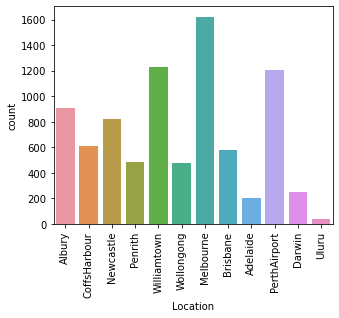

In [89]:
print(df.Location.value_counts())
plt.figure(figsize=(5,4))
sns.countplot(cat_features['Location'])
plt.xticks(rotation=90,fontsize=10)

- Melbourne has Highest majority of count.
- similarly Uluru has least amount of count.
- we see that location column has not seem any huge issue, so let's moved to missing values in categorical features:

### Missing values in categorical features:


In [90]:
cat_features.isna().sum()

Date              0
Location          0
WindGustDir     991
WindDir9am      829
WindDir3pm      308
RainToday       240
RainTomorrow    239
dtype: int64

- There seems to be high number of missing values present in our dataset.
- `WindGustDir` has highest number of missing values.
- There is no missing values present in `Date` and `Location`, Which is good sign for us.

### exploring with Date column.:
 we will do some feature engineering to lower to cardinality of the Date column. It seems reasonable to break Date column into year,month and day.


In [91]:
### parse the datetime
df['Date']=pd.to_datetime(df['Date'])
df['Day']= df['Date'].dt.day
df['Month']= df['Date'].dt.month
df['Year']= df['Date'].dt.year
### dropping the date column
df.drop('Date',axis=1,inplace=True)
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008


In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       8425 non-null   object 
 1   MinTemp        8350 non-null   float64
 2   MaxTemp        8365 non-null   float64
 3   Rainfall       8185 non-null   float64
 4   Evaporation    4913 non-null   float64
 5   Sunshine       4431 non-null   float64
 6   WindGustDir    7434 non-null   object 
 7   WindGustSpeed  7434 non-null   float64
 8   WindDir9am     7596 non-null   object 
 9   WindDir3pm     8117 non-null   object 
 10  WindSpeed9am   8349 non-null   float64
 11  WindSpeed3pm   8318 non-null   float64
 12  Humidity9am    8366 non-null   float64
 13  Humidity3pm    8323 non-null   float64
 14  Pressure9am    7116 non-null   float64
 15  Pressure3pm    7113 non-null   float64
 16  Cloud9am       6004 non-null   float64
 17  Cloud3pm       5970 non-null   float64
 18  Temp9am 

In [93]:
df.Month.value_counts()

6     818
5     801
3     761
1     753
12    741
7     732
8     682
10    655
11    653
2     620
9     609
4     600
Name: Month, dtype: int64

- we can see in the above graph  that all the count of observation is in almost same range.

#### WindGustDir column:

N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: WindGustDir, dtype: int64


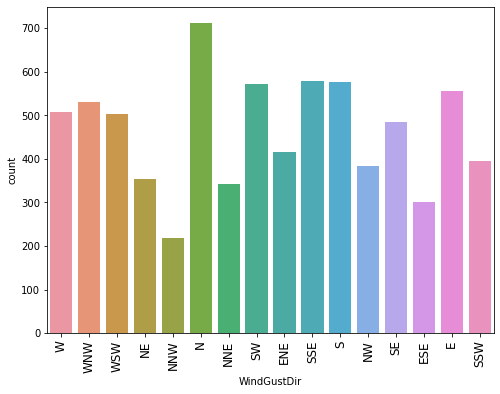

In [95]:
## value count
print(df.WindGustDir.value_counts())
plt.figure(figsize=(8,6))
sns.countplot(df.WindGustDir)
plt.xticks(rotation=90,fontsize=12)
plt.show()

- We notice that all the wind directions have almost same range of count.
- We can employ the one hot encoding for that but implement of an additional value NaN for missing value. We are not sure that why there are missing values.

In [96]:
df.WindGustDir.isna().sum()

991

- We will handle missing value in encoding part for WindGustDir feature.

### WinDir9am column:

N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    433
NNE    430
W      414
NE     409
S      402
E      380
SSE    365
NNW    280
ESE    253
Name: WindDir9am, dtype: int64


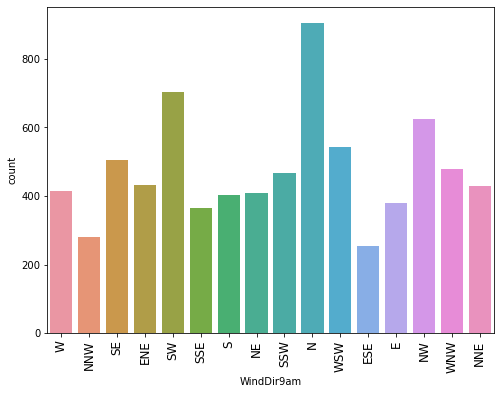

In [97]:
## value count
print(df.WindDir9am.value_counts())
plt.figure(figsize=(8,6))
sns.countplot(df.WindDir9am)
plt.xticks(rotation=90,fontsize=12)
plt.show()


In [98]:
df.WindDir9am.isna().sum()

829

- it is similar to previous one. We will take care of that in Encoding part.

### WinDir3pm column:

SE     813
S      742
SSE    623
WSW    580
NE     544
N      524
SW     494
WNW    487
NW     468
ESE    462
W      462
E      460
ENE    417
SSW    370
NNE    365
NNW    306
Name: WindDir3pm, dtype: int64


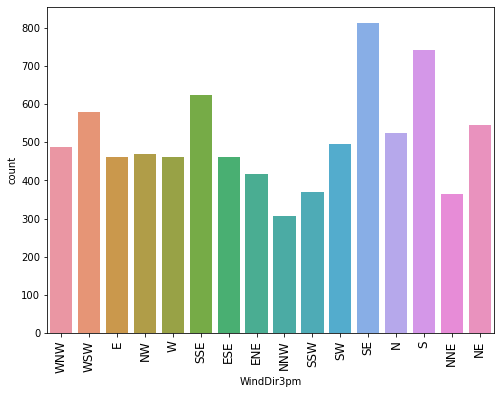

In [99]:
## value count
print(df.WindDir3pm.value_counts())
plt.figure(figsize=(8,6))
sns.countplot(df.WindDir3pm)
plt.xticks(rotation=90,fontsize=12)
plt.show()

In [100]:
df.WindDir3pm.isna().sum()

308

- A little less missing values compared to previous columns.
- Similarly we will take care of missing value in encoding part for this column also.

### `RainToday` column:

No     6195
Yes    1990
Name: RainToday, dtype: int64


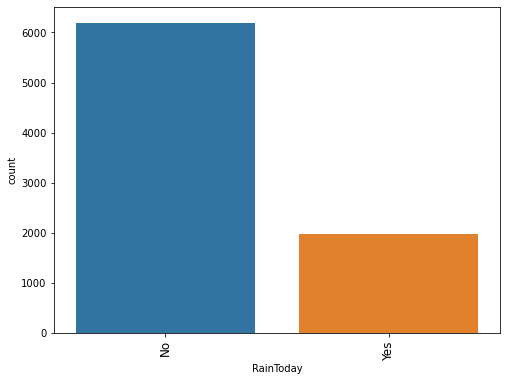

In [101]:
## value count
print(df.RainToday.value_counts())
plt.figure(figsize=(8,6))
sns.countplot(df.RainToday)
plt.xticks(rotation=90,fontsize=12)
plt.show()

In [102]:

## converting target in to numeric:
df.RainTomorrow=df.RainTomorrow.replace({'No':0,
                                        'Yes':1})

- There are highest count of No for Rainfall today.
#### missing values:

In [103]:
df.RainToday.isna().sum()

240

- There are least count of missing values as compared to the all previous feature.
- We are not sure why there is a missing value so what we will do we will take care of those missing values in encoding part.

## Numeracal Features:

## Target vs Numeric Features:

In [104]:
## defining a function:

def TargetVsFeature(feature):
    plt.figure(figsize=(11,6))
    sns.lineplot(x=feature,y='RainTomorrow',data=df,palette='hls',color='blue')
    plt.title('Relation With Line Plot',fontsize=20)
    plt.xlabel(feature,fontsize=15)
    plt.ylabel('RainTomorrow',fontsize=15)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.tight_layout()

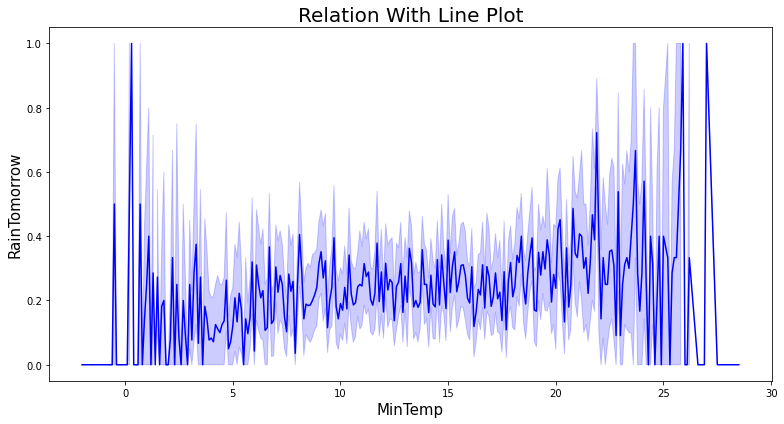

In [105]:
TargetVsFeature('MinTemp')

- As MinTemp increases the chance of Raintomorrow is also increasing.

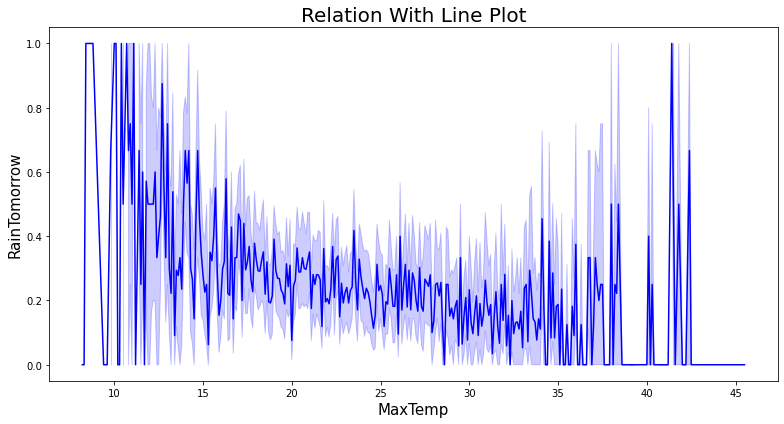

In [106]:
TargetVsFeature('MaxTemp')

- we can see that there is a down word trend.
- As maxtemp is increasing the chances of raintomorrow is decreasing.

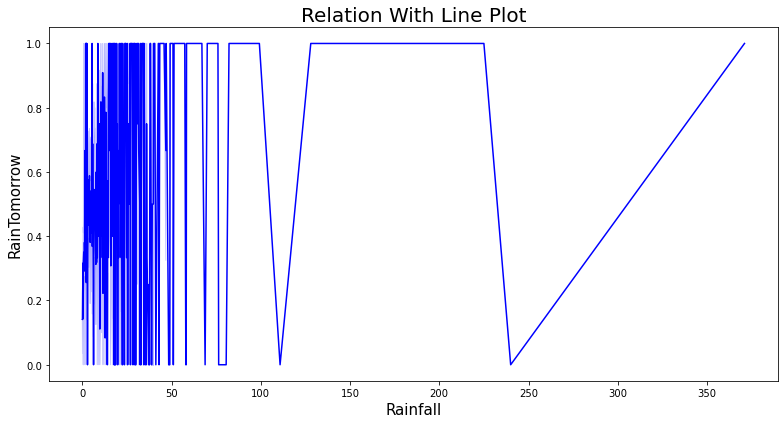

In [107]:
TargetVsFeature('Rainfall')

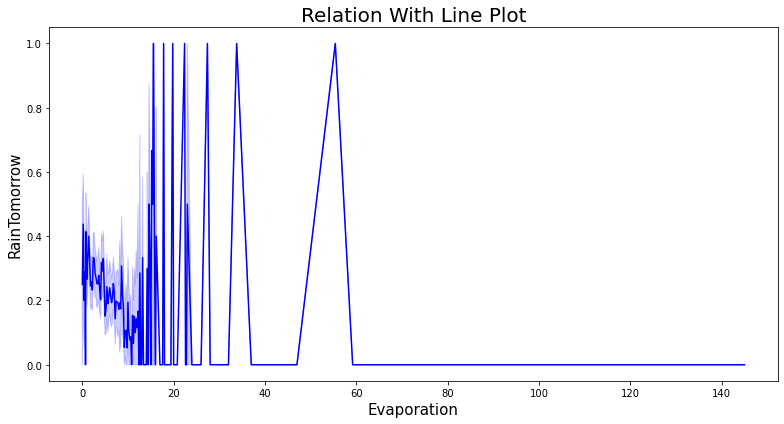

In [108]:
TargetVsFeature('Evaporation')

- As evaporation rate is going more than 60 the chance of raintomorrow is almost 0.

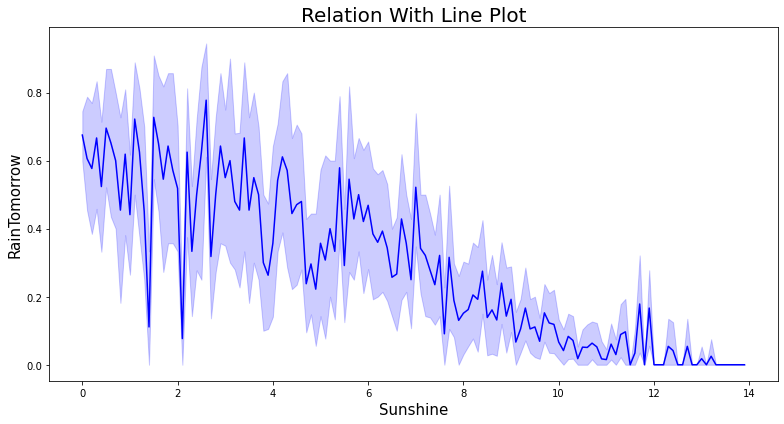

In [109]:
TargetVsFeature('Sunshine')

- we can see there is quite strong downword trend.
- As sunshine rate increasing, the  chance of raintomorrow is decreasing.

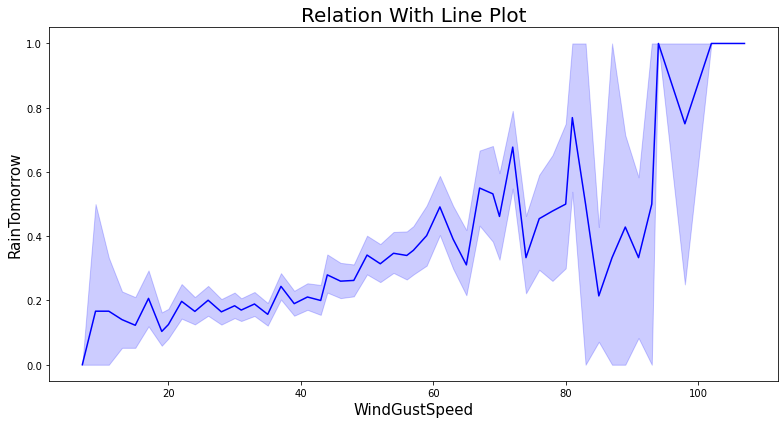

In [110]:
TargetVsFeature('WindGustSpeed')

- as Wind Gust Speed is increasing the percentage chance of rainfall is also increases. 

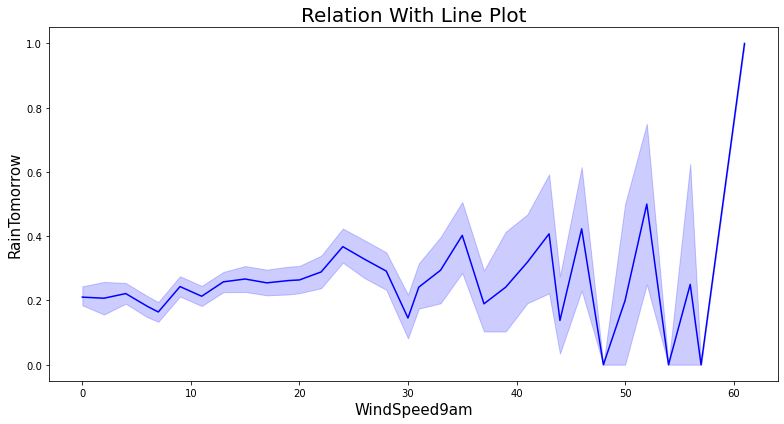

In [111]:
TargetVsFeature('WindSpeed9am')

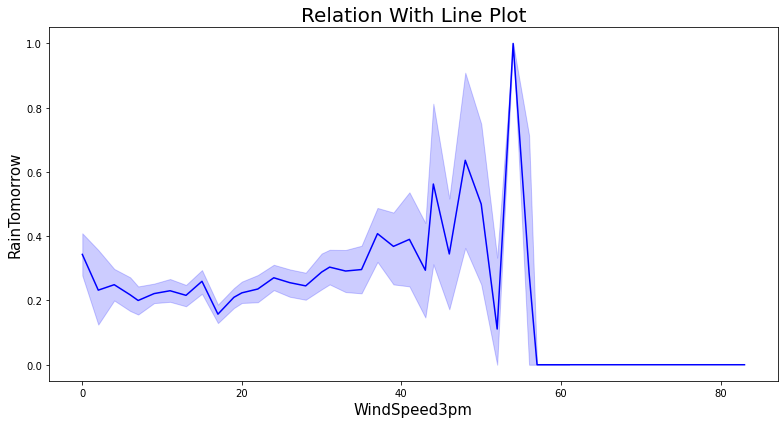

In [112]:
TargetVsFeature('WindSpeed3pm')

- As wind speed 3pm rate goes up to 60 then rainfall chances is almost zero.

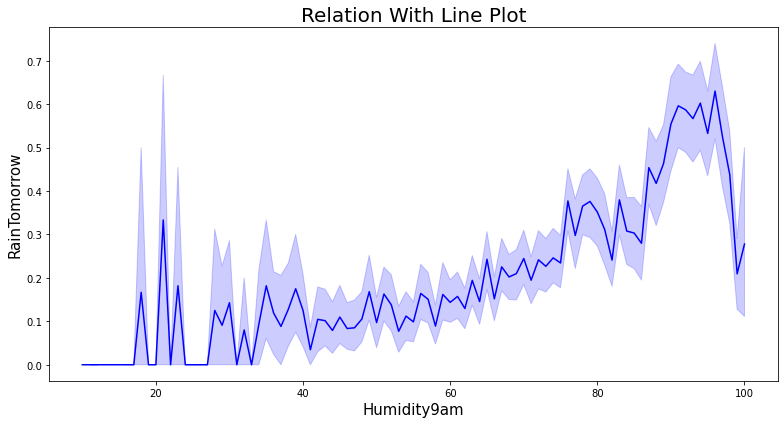

In [113]:
TargetVsFeature('Humidity9am')

- As humidity increases the chance of Raintomorrow is also increases.

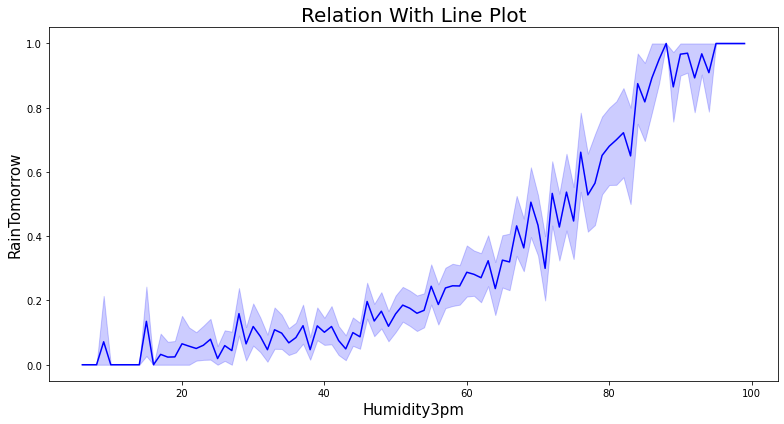

In [114]:
TargetVsFeature('Humidity3pm')

overall we can say if humidity increases the raintomorrow chances also increases.

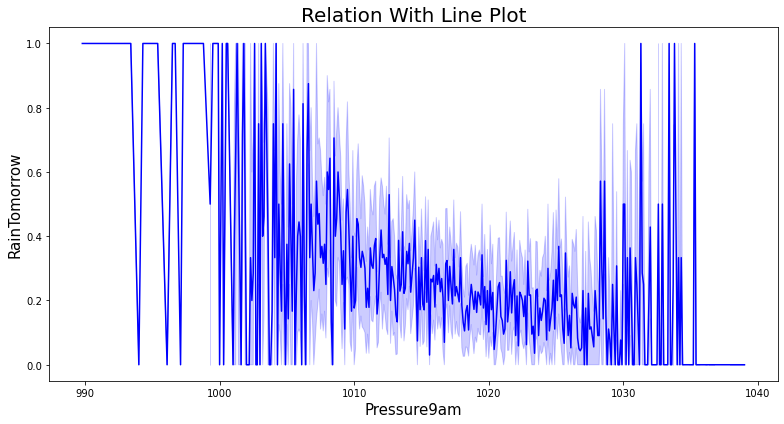

In [115]:
TargetVsFeature('Pressure9am')

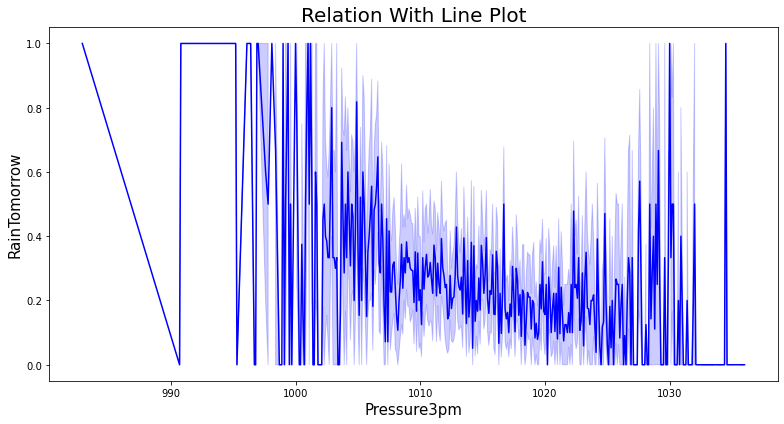

In [116]:
TargetVsFeature('Pressure3pm')

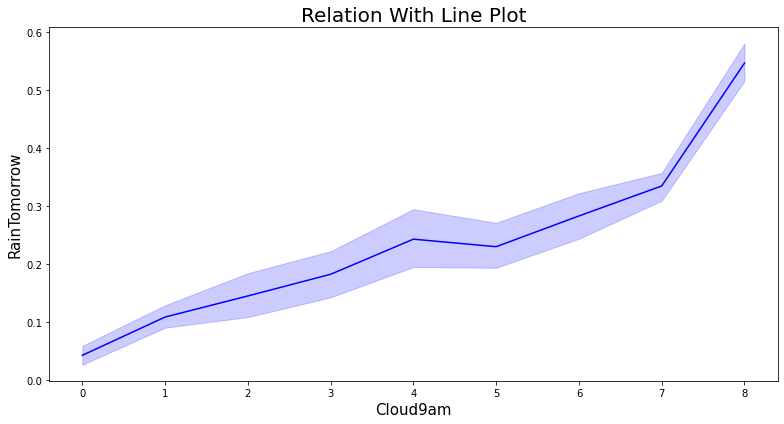

In [117]:
TargetVsFeature('Cloud9am')

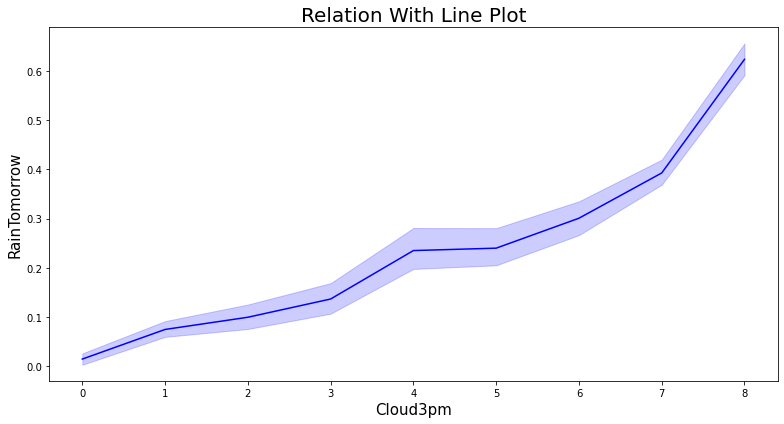

In [118]:
TargetVsFeature('Cloud3pm')

- If the number of cloud increases the rainfall chances for tomorrow is also increases. 
- There is not any difference is  cloud at 3pm or 9am.

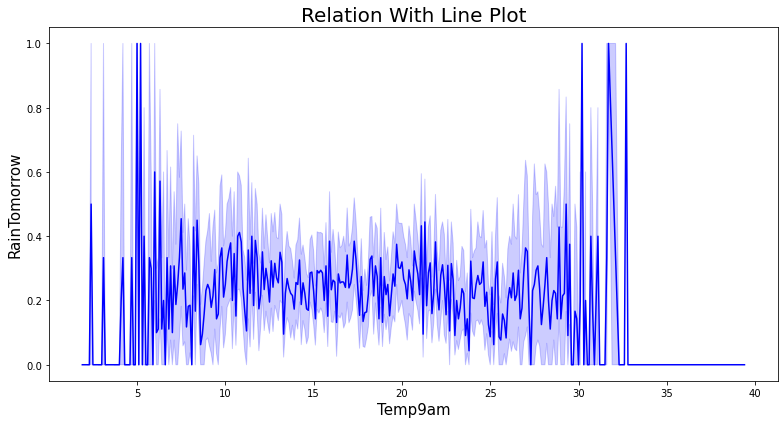

In [119]:
TargetVsFeature('Temp9am')

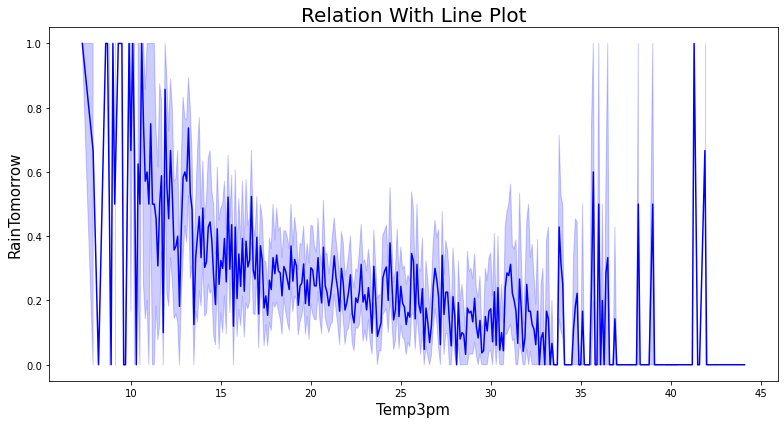

In [120]:
TargetVsFeature('Temp3pm')

- There is not any relation with temprature of at 9 am.
- But if Temprature at 3 pm increases then the number of chances increases for rainfall.

## Missing Values:

In [121]:
### separating numerical features:
num_features=df.select_dtypes(include=['float64'])
num_features.isna().sum()

MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustSpeed     991
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainTomorrow      239
dtype: int64

In [122]:
num_features.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000,8186.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934,0.243220
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020,0.429053
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,0.000000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000,0.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000,0.000000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000,0.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,1.000000


- Based on the table above, there may be outliers in Rainfall, Evaporation,Windspeed9am and Windspeed3pm. This is inferred from the difference between the row max and the other rows, and how far it is away from 75%.

### Distribution of Continous data:

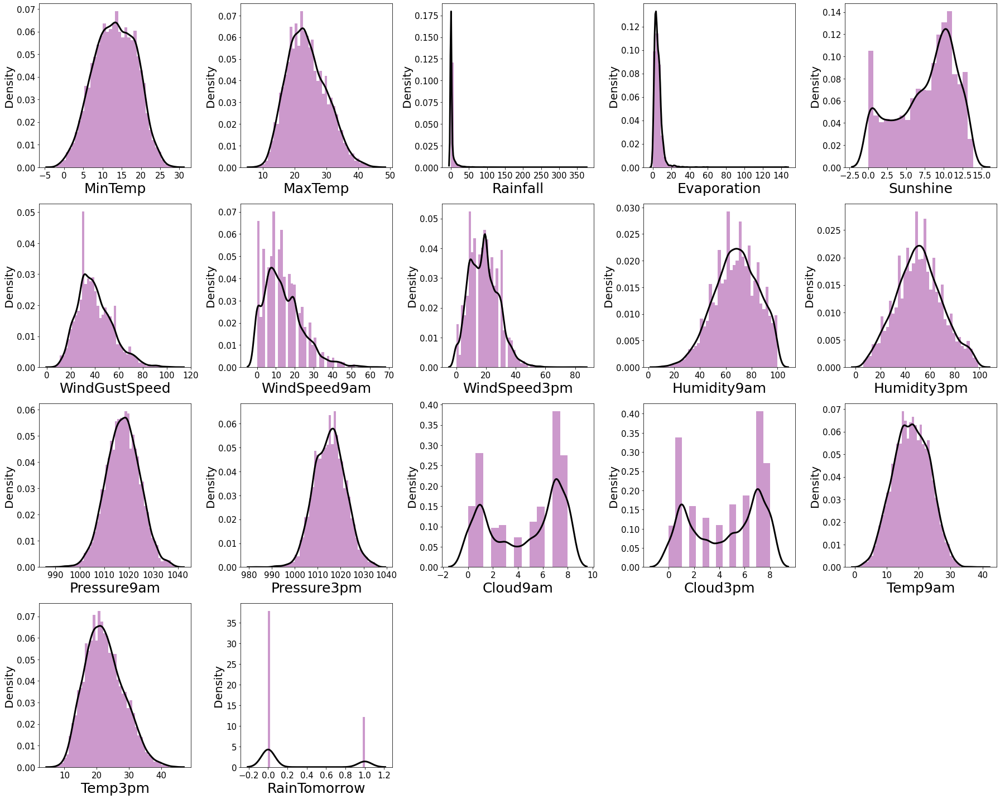

In [123]:
plt.figure(figsize=(25,20))
plotnumber=1
for column in num_features.columns:
    if plotnumber<=30:
        ax=plt.subplot(4,5,plotnumber)
        sns.distplot(x=num_features[column],color='purple',kde_kws={"color": "k", "lw": 3, "label": "KDE"})
        plt.xlabel(column,fontsize=25)
        plt.ylabel('Density',fontsize=20)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
    plotnumber+=1
plt.tight_layout()

### Observations:
- As we assume that  Rainfall, Evaporation,Windspeed9am and Windspeed3pm features highly right skewed, may be there are lot of outliers present in the dataset.
- Some features are still little skewed from right and left both side. For that we will use some power transformation technique to handle them.

## Handling Missing Values:

We see that our target variable has also missing value present. So for that we will drop them as they are useless for us.

In [124]:
print(" Missing Values for Target varibale 'RainTomorrow' : ", df.RainTomorrow.isna().sum())
print("\n")
### Dropping na for target variable
df.dropna(subset=['RainTomorrow'],inplace=True)

print("After dropping the missing value in RainTomorrow variable, the number of missing value in RainTomorrow is: ",df.RainTomorrow.isna().sum())

 Missing Values for Target varibale 'RainTomorrow' :  239


After dropping the missing value in RainTomorrow variable, the number of missing value in RainTomorrow is:  0


#### Filling the missing value with mode for categorical feature :

In [125]:
cat_features=df.select_dtypes(include=['object'])
for i in cat_features:
    if df[i].isna().any()==True:
        df[i].fillna(df[i].mode()[0], inplace=True)


#### Filling missing value with median for numerical feature:


In [126]:
num_features=df.select_dtypes(include=['float64'])
for i in num_features:
    if df[i].isna().any()==True:
        df[i].fillna(df[i].median(), inplace=True)


In [127]:
df.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Day              0
Month            0
Year             0
dtype: int64

<AxesSubplot:xlabel='Year', ylabel='Rainfall'>

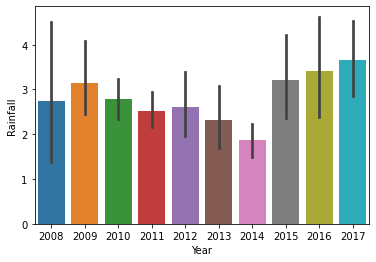

In [128]:
sns.barplot(x='Year',y='Rainfall',data=df.sort_values('Year',ascending=True))

- we can see thatt in 2017 the rainfall rate is very high.
- In 2014 the rainfall rate is least.

### Checking Outliers:
 Rainfall, Evaporation,Windspeed9am and Windspeed3pm features are highly skewed.
 
 let's check outliers for those features:

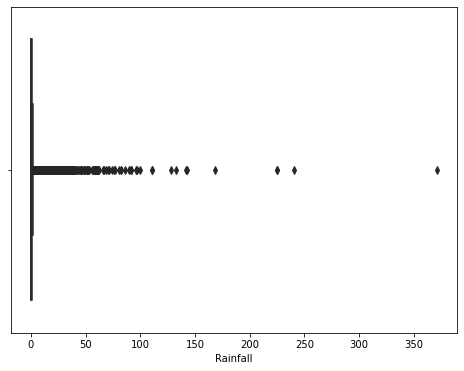

In [129]:
### RainFall

plt.figure(figsize=(8,6))
sns.boxplot(df['Rainfall'],color='g')
plt.show()

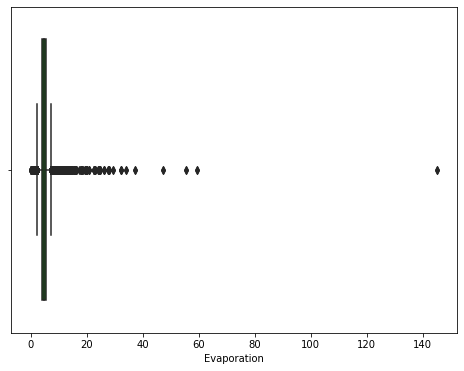

In [130]:
### Evaporation      

plt.figure(figsize=(8,6))
sns.boxplot(df['Evaporation'],color='g')
plt.show()

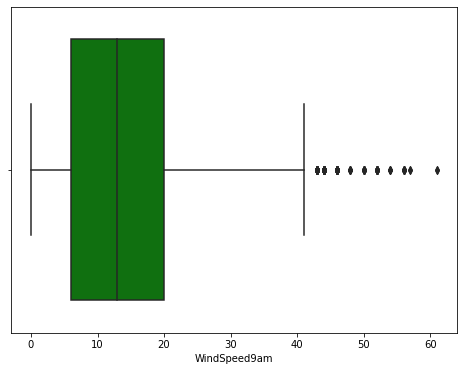

In [131]:
##WindSpeed9am     


plt.figure(figsize=(8,6))
sns.boxplot(df['WindSpeed9am'],color='g')
plt.show()

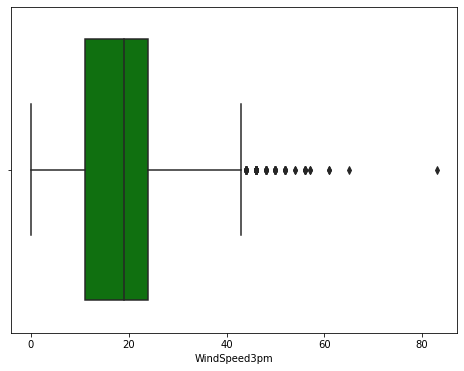

In [132]:
## ##WindSpeed3pm 

plt.figure(figsize=(8,6))
sns.boxplot(df['WindSpeed3pm'],color='g')
plt.show()

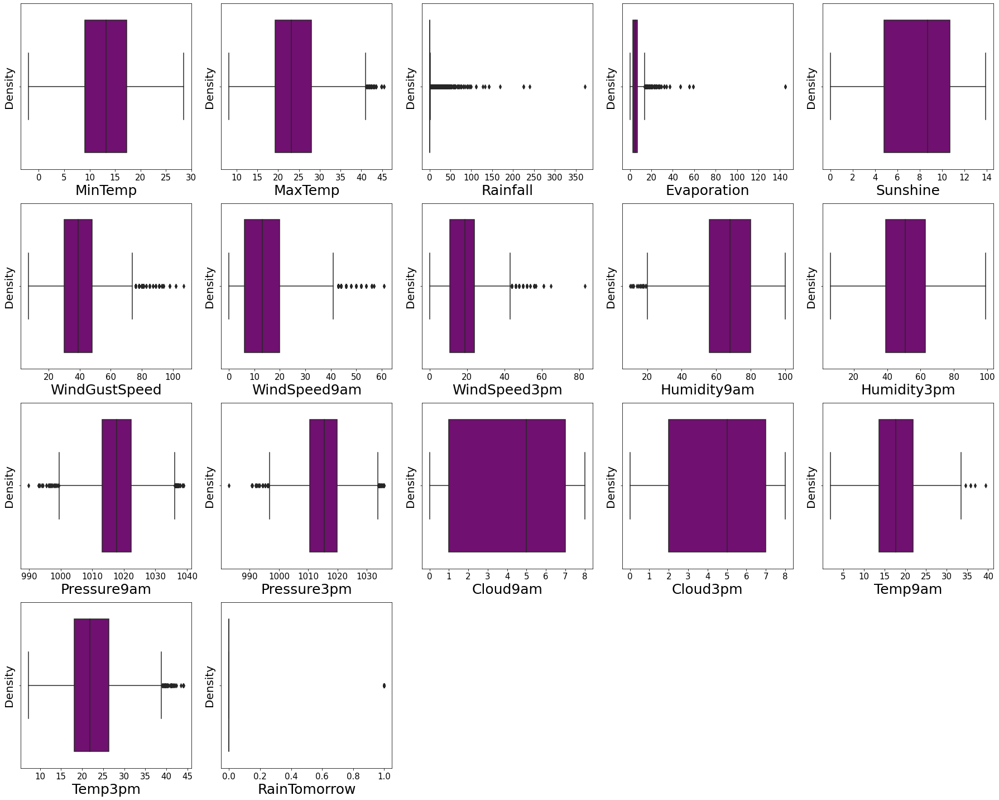

In [133]:
plt.figure(figsize=(25,20))
plotnumber=1
for column in num_features.columns:
    if plotnumber<=30:
        ax=plt.subplot(4,5,plotnumber)
        sns.boxplot(x=num_features[column],color='purple')
        plt.xlabel(column,fontsize=25)
        plt.ylabel('Density',fontsize=20)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
    plotnumber+=1
plt.tight_layout()

#### We can All Those features have lot of outliers 
## Handle outlier zscore method:

In [134]:
## separating the continuous data type features
list_cont=['Rainfall','Evaporation','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Pressure9am',
           'Pressure3pm','Temp9am','Temp3pm']

from scipy.stats import zscore
z_score=zscore(df[list_cont])
abs_z_score=np.abs(z_score)

In [135]:
removing_outlier=(abs_z_score<3).all(axis=1)
df_new=df[removing_outlier]
print('Pervious Shape:', df.shape)
print('After removing the new shape : ',df_new.shape)

Pervious Shape: (8186, 25)
After removing the new shape :  (7772, 25)


## DataLoss:

In [136]:
loss=(8186-7772)/8186*100
print('The Data Loss is : ', loss)

The Data Loss is :  5.057415098949425


- Data loss is accpetable range let's keep going ahead:

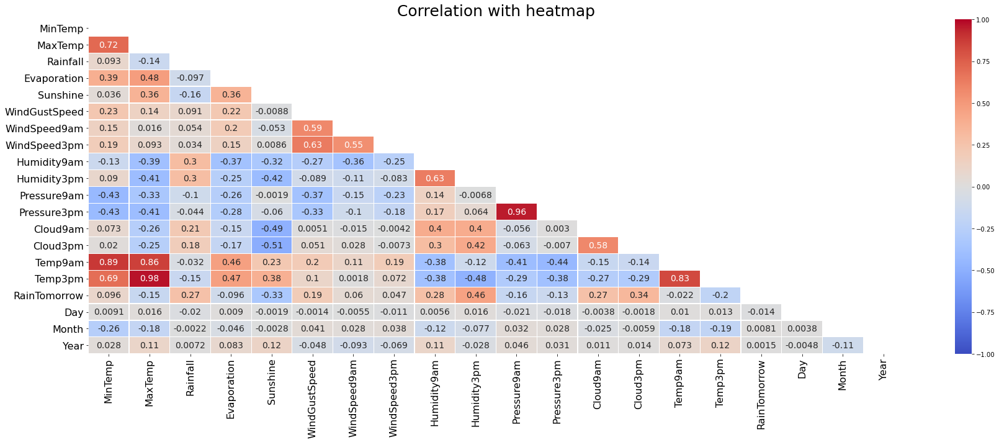

In [137]:
plt.figure(figsize=(25, 10))

corr = df_new.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

ax = sns.heatmap(corr, mask=mask, xticklabels=corr.columns, yticklabels=corr.columns, annot_kws={'size':14},
                 annot=True, linewidths=.2, cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.title("Correlation with heatmap",fontsize=25)
plt.tight_layout()

## Observations of heatmap:
- MaxTemp and Temp3pm features are highest correlated with each other as 97% correlation.
- similarly Pressure9am and pressure3pm features also highly correlated with each other as 96% correlation.
- MaxTtemp and minTemp are highly correlate with Temp9am as 86% and 89% respectvely.
- Temp9am is 83% correlated with temp3pm.

### Feature vs Feature:

In [138]:
def featureVsfeature(feature1,feature2):
    plt.figure(figsize=(7,6))
    sns.scatterplot(feature1,feature2,data=df_new,color='r')
    plt.xlabel(feature1,fontsize=15)
    plt.ylabel(feature2,fontsize=15)
    plt.show()

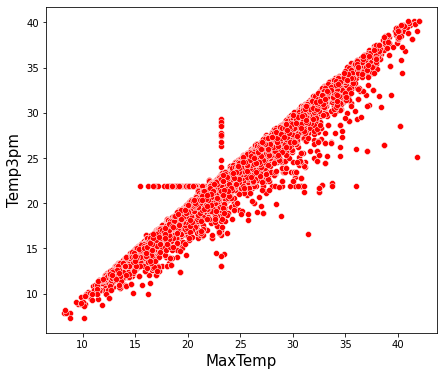

In [139]:
featureVsfeature('MaxTemp','Temp3pm')

- we can see there is clear trend .
- MaxTemp and Temp3pm is highly correlate with eachother.

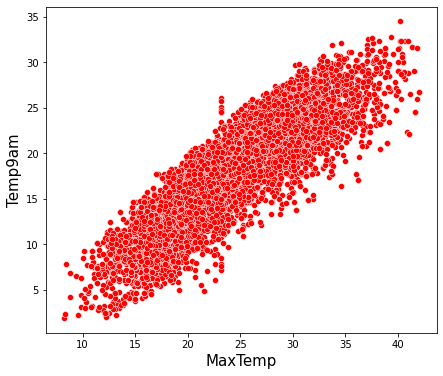

In [140]:
featureVsfeature('MaxTemp','Temp9am')

- MaxTemp and Temp9am is also tightly correlate with each other.



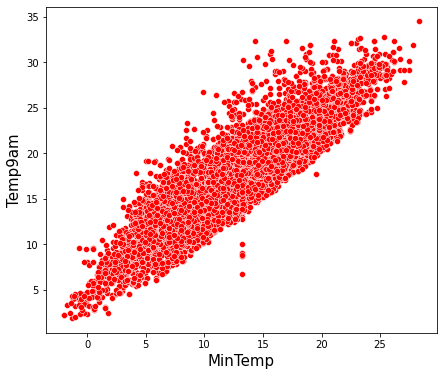

In [141]:
featureVsfeature('MinTemp','Temp9am')

- Temp9am and MinTemp is also tighly correlate with eachother.

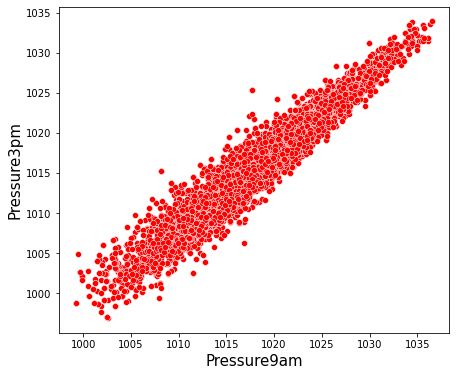

In [142]:
featureVsfeature('Pressure9am','Pressure3pm')

- There is not much differece with pressure at 3pm and pressure at 9 am. It means that Pressure is similar at day and night.

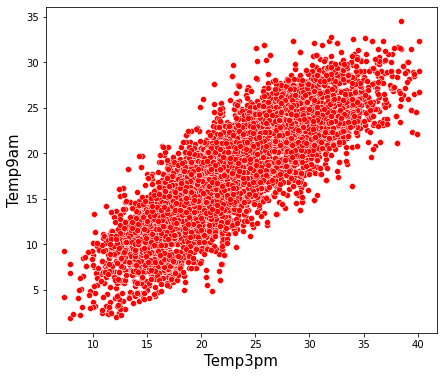

In [143]:
featureVsfeature('Temp3pm','Temp9am')

- There is also we can see the positive trend. 

### Pair Plot:

<Figure size 1080x1080 with 0 Axes>

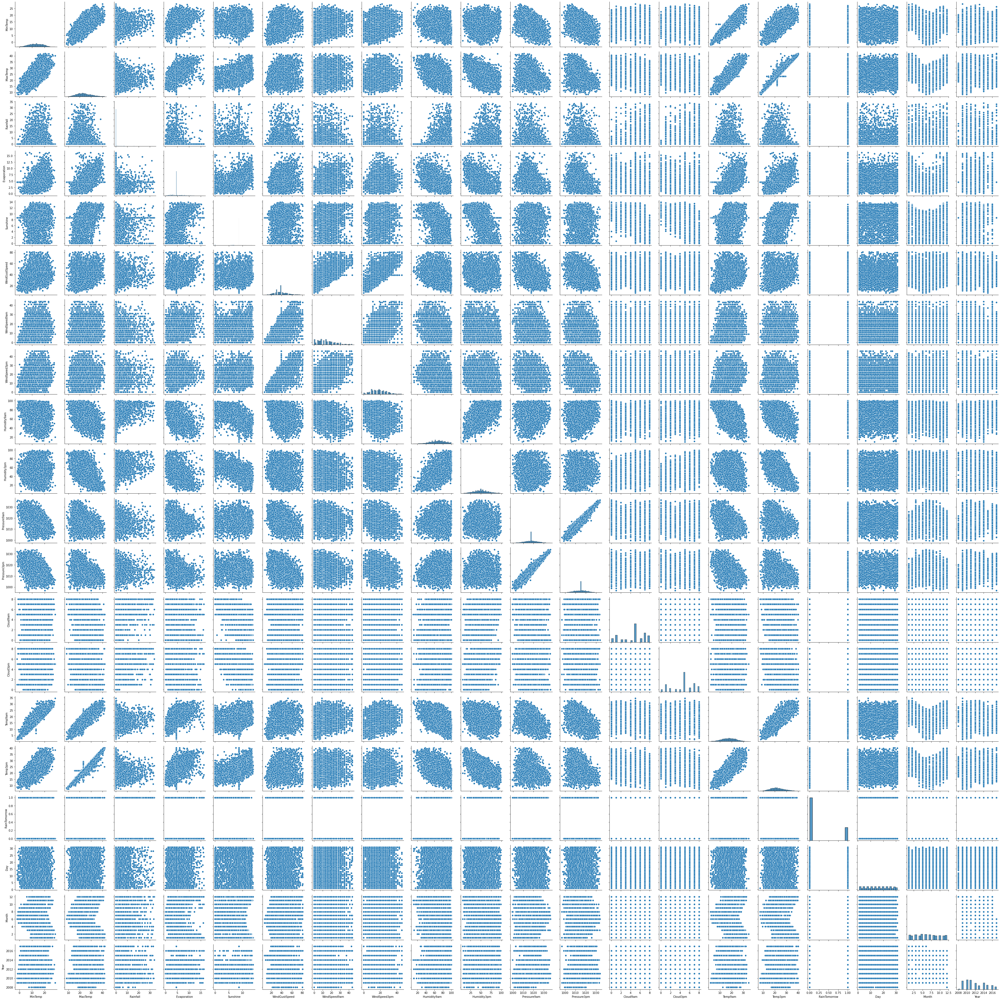

In [82]:
## pair plot
plt.figure(figsize=(15,15))
sns.pairplot(df_new,diag_kind='hist')
plt.xticks(rotation=45,fontsize=17)
plt.yticks(rotation=45,fontsize=17)
plt.tight_layout()

### Correaltion with Target:

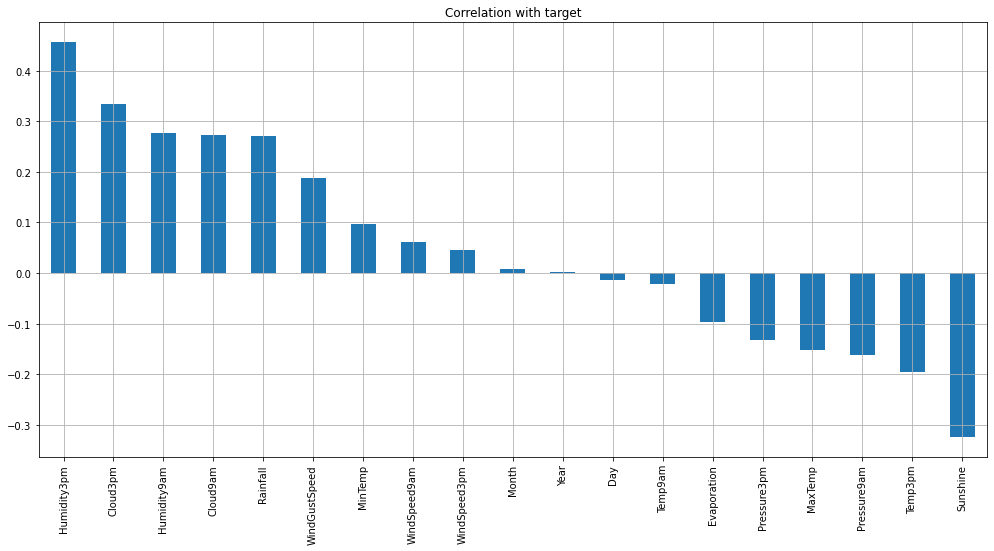

In [144]:
plt.figure(figsize=(15,10))
df_new.drop('RainTomorrow',axis=1).corrwith(df_new.RainTomorrow).sort_values(ascending=False).plot(kind='bar',grid=True,figsize=(17,8),title='Correlation with target')

plt.show()

- Humidity3pm is highest correlated with target variable.
- Shunshine is highest negative correlated with target variable.
- Month, year,day,temp9am is least correlated with target vaiablle.

### Dropping the column As their is Multicollinearity exists:
- temp9am is highly correlated with MinTemp and Maxtemp , and it is very less correlate with target so we will drop it.
- MaxTemp and Temp3am is highly correlated with each other. As Temp3am is higher correlate with Maxtemp then we will delete MaxTemp feature as well.
- Pressure3pm and Pressure9am is tightly correlate with each other. As Pressure3pm is less correlate with eachother so We will drop it .

In [224]:
df_new.drop(columns=['Temp9am','Pressure3pm'],inplace=True)
plt.figure(figsize=(25, 10))


corr = df_new.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

ax = sns.heatmap(corr, mask=mask, xticklabels=corr.columns, yticklabels=corr.columns, annot_kws={'size':14},
                # annot=True, linewidths=.2, cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.title("Correlation with heatmap",fontsize=25)
plt.tight_layout()

- We handle multicollinearity problem now. 

let's encode the dataset now:
## Encoding:

- We will encode the categorical feature with onehot encoding.

In [146]:
df_new.head()

,Location,MinTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,0.6,4.6,8.7,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,8.0,5.0,21.8,No,0.0,1,12,2008
1,Albury,7.4,0.0,4.6,8.7,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,5.0,5.0,24.3,No,0.0,2,12,2008
2,Albury,12.9,0.0,4.6,8.7,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,5.0,2.0,23.2,No,0.0,3,12,2008
3,Albury,9.2,0.0,4.6,8.7,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,5.0,5.0,26.5,No,0.0,4,12,2008
4,Albury,17.5,1.0,4.6,8.7,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,7.0,8.0,29.7,No,0.0,5,12,2008


We will encode the the year feature as well for best performance.

In [147]:
df_new.Year=df_new['Year'].astype(str)
df_new.dtypes

Location          object
MinTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Cloud9am         float64
Cloud3pm         float64
Temp3pm          float64
RainToday         object
RainTomorrow     float64
Day                int64
Month              int64
Year              object
dtype: object

## Checking Skewness:

In [148]:
df_new.skew()

MinTemp         -0.069008
Rainfall         3.504086
Evaporation      1.271262
Sunshine        -1.220794
WindGustSpeed    0.546183
WindSpeed9am     0.711332
WindSpeed3pm     0.305290
Humidity9am     -0.260953
Humidity3pm      0.122499
Pressure9am      0.028552
Cloud9am        -0.483918
Cloud3pm        -0.434046
Temp3pm          0.341153
RainTomorrow     1.253135
Day             -0.001281
Month            0.063468
Year             0.436590
dtype: float64

###### below features are little skewed let's hanle them

### handling skewness:

In [149]:
feature=['Rainfall','Evaporation','Sunshine','WindSpeed9am','WindGustSpeed']
from sklearn.preprocessing import PowerTransformer
pt=PowerTransformer()
for i in feature:
    df_new[i]=pt.fit_transform(df_new[i].values.reshape(-1,1))
df_new.skew()

MinTemp         -0.069008
Rainfall         1.029230
Evaporation      0.059465
Sunshine        -0.205777
WindGustSpeed    0.004241
WindSpeed9am    -0.114075
WindSpeed3pm     0.305290
Humidity9am     -0.260953
Humidity3pm      0.122499
Pressure9am      0.028552
Cloud9am        -0.483918
Cloud3pm        -0.434046
Temp3pm          0.341153
RainTomorrow     1.253135
Day             -0.001281
Month            0.063468
Year             0.436590
dtype: float64

- We handle the skewness using power transform.

In [150]:
df1=pd.get_dummies(df_new[['Location','WindGustDir','WindDir9am','WindDir3pm','Year','RainToday']],drop_first=True)

In [151]:
df1

,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,Year_2009,Year_2010,Year_2011,Year_2012,Year_2013,Year_2014,Year_2015,Year_2016,Year_2017,RainToday_Yes
0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8420,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8421,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8422,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0


In [152]:
df_new.drop(columns=['Location','WindGustDir','WindDir9am','WindDir3pm','Year','RainToday'],inplace=True)
df=df_new.join(df1)
df

,MinTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,Temp3pm,RainTomorrow,Day,Month,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,Year_2009,Year_2010,Year_2011,Year_2012,Year_2013,Year_2014,Year_2015,Year_2016,Year_2017,RainToday_Yes
0,13.4,0.755591,0.027876,0.05584,0.455047,0.787387,24.0,71.0,22.0,1007.7,8.0,5.0,21.8,0.0,1,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,7.4,-0.658665,0.027876,0.05584,0.455047,-0.971815,22.0,44.0,25.0,1010.6,5.0,5.0,24.3,0.0,2,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,12.9,-0.658665,0.027876,0.05584,0.599264,0.703961,26.0,38.0,30.0,1007.6,5.0,2.0,23.2,0.0,3,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,9.2,-0.658665,0.027876,0.05584,-1.239546,-0.054966,9.0,45.0,16.0,1017.6,5.0,5.0,26.5,0.0,4,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,17.5,1.117943,0.027876,0.05584,0.231984,-0.530802,20.0,82.0,33.0,1010.8,7.0,8.0,29.7,0.0,5,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,3.5,-0.658665,0.027876,0.05584,-0.582345,0.347902,13.0,59.0,27.0,1024.7,5.0,5.0,20.9,0.0,20,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8420,2.8,-0.658665,0.027876,0.05584,-0.582345,0.153510,11.0,51.0,24.0,1024.6,5.0,5.0,22.4,0.0,21,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8421,3.6,-0.658665,0.027876,0.05584,-1.445432,0.153510,9.0,56.0,21.0,1023.5,5.0,5.0,24.5,0.0,22,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8422,5.4,-0.658665,0.027876,0.05584,-0.079452,-0.281196,9.0,53.0,24.0,1021.0,5.0,5.0,26.1,0.0,23,6,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0


### Feature Selection:

In [153]:
### Splitting the dataset
x=df.drop('RainTomorrow',axis=1)
y=df['RainTomorrow']
print(x.isna().any().sum())
print(y.isna().sum())

0
0


In [154]:
x

,MinTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,Temp3pm,Day,Month,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,Year_2009,Year_2010,Year_2011,Year_2012,Year_2013,Year_2014,Year_2015,Year_2016,Year_2017,RainToday_Yes
0,13.4,0.755591,0.027876,0.05584,0.455047,0.787387,24.0,71.0,22.0,1007.7,8.0,5.0,21.8,1,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,7.4,-0.658665,0.027876,0.05584,0.455047,-0.971815,22.0,44.0,25.0,1010.6,5.0,5.0,24.3,2,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,12.9,-0.658665,0.027876,0.05584,0.599264,0.703961,26.0,38.0,30.0,1007.6,5.0,2.0,23.2,3,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,9.2,-0.658665,0.027876,0.05584,-1.239546,-0.054966,9.0,45.0,16.0,1017.6,5.0,5.0,26.5,4,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,17.5,1.117943,0.027876,0.05584,0.231984,-0.530802,20.0,82.0,33.0,1010.8,7.0,8.0,29.7,5,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,3.5,-0.658665,0.027876,0.05584,-0.582345,0.347902,13.0,59.0,27.0,1024.7,5.0,5.0,20.9,20,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8420,2.8,-0.658665,0.027876,0.05584,-0.582345,0.153510,11.0,51.0,24.0,1024.6,5.0,5.0,22.4,21,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8421,3.6,-0.658665,0.027876,0.05584,-1.445432,0.153510,9.0,56.0,21.0,1023.5,5.0,5.0,24.5,22,6,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
8422,5.4,-0.658665,0.027876,0.05584,-0.079452,-0.281196,9.0,53.0,24.0,1021.0,5.0,5.0,26.1,23,6,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0


In [155]:
from sklearn.feature_selection import SelectKBest,f_classif

In [156]:
best_features=SelectKBest(score_func=f_classif,k=50)  ### choosing top 50 features.
fit=best_features.fit(x,y)

In [157]:
df_scores=pd.DataFrame(fit.scores_)
df_columns=pd.DataFrame(x.columns)

### joining the both data frame
features_scores=pd.concat([df_columns,df_scores],axis=1)
features_scores.columns=['Feature_name','Score']
print(features_scores.nlargest(50,'Score'))

             Feature_name        Score
8             Humidity3pm  2047.943419
11               Cloud3pm   983.260982
3                Sunshine   906.221109
1                Rainfall   871.157133
80          RainToday_Yes   744.823637
7             Humidity9am   649.738182
10               Cloud9am   624.748194
12                Temp3pm   310.408995
4           WindGustSpeed   256.500168
9             Pressure9am   207.652978
2             Evaporation    76.839231
0                 MinTemp    72.687793
5            WindSpeed9am    28.342475
43           WindDir9am_N    23.951336
18        Location_Darwin    20.676397
41         WindDir9am_ENE    19.775124
66         WindDir3pm_SSW    18.265852
61         WindDir3pm_NNW    17.779349
6            WindSpeed3pm    16.854825
26        WindGustDir_ENE    14.737534
74              Year_2012    14.020869
22  Location_PerthAirport    11.790113
23         Location_Uluru    11.716490
77              Year_2015    10.823642
49          WindDir9am_SE

In [163]:
new_x=x[['Humidity3pm','Cloud3pm','Sunshine','RainToday_Yes','Humidity9am','Cloud9am','Rainfall','Temp3pm',
'WindGustSpeed','Pressure9am','MinTemp','Evaporation','WindSpeed9am','WindDir9am_N','Location_Darwin',
'WindDir9am_ENE','WindDir3pm_SSW','WindDir3pm_NNW','WindSpeed3pm','WindGustDir_ENE','Year_2012','Location_PerthAirport',
'Location_Uluru','Year_2015','WindDir9am_SE','Year_2017','WindDir9am_SW','Location_CoffsHarbour','WindDir9am_WNW',
'Year_2013','Location_Williamtown','WindDir3pm_ESE','WindGustDir_N','Year_2014','Location_Melbourne','WindDir3pm_N',
'WindGustDir_SSW','WindGustDir_SW','WindGustDir_W','WindGustDir_NNW','WindDir3pm_NE','WindDir9am_NNE',
'Year_2010','WindDir3pm_W','WindDir3pm_SSE','Location_Albury','WindGustDir_WSW','WindDir9am_SSE','Location_Wollongong',
         'WindDir3pm_WNW']]

In [164]:
new_x

,Humidity3pm,Cloud3pm,Sunshine,RainToday_Yes,Humidity9am,Cloud9am,Rainfall,Temp3pm,WindGustSpeed,Pressure9am,MinTemp,Evaporation,WindSpeed9am,WindDir9am_N,Location_Darwin,WindDir9am_ENE,WindDir3pm_SSW,WindDir3pm_NNW,WindSpeed3pm,WindGustDir_ENE,Year_2012,Location_PerthAirport,Location_Uluru,Year_2015,WindDir9am_SE,Year_2017,WindDir9am_SW,Location_CoffsHarbour,WindDir9am_WNW,Year_2013,Location_Williamtown,WindDir3pm_ESE,WindGustDir_N,Year_2014,Location_Melbourne,WindDir3pm_N,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_NNW,WindDir3pm_NE,WindDir9am_NNE,Year_2010,WindDir3pm_W,WindDir3pm_SSE,Location_Albury,WindGustDir_WSW,WindDir9am_SSE,Location_Wollongong,WindDir3pm_WNW
0,22.0,5.0,0.05584,0,71.0,8.0,0.755591,21.8,0.455047,1007.7,13.4,0.027876,0.787387,0,0,0,0,0,24.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1
1,25.0,5.0,0.05584,0,44.0,5.0,-0.658665,24.3,0.455047,1010.6,7.4,0.027876,-0.971815,0,0,0,0,0,22.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,30.0,2.0,0.05584,0,38.0,5.0,-0.658665,23.2,0.599264,1007.6,12.9,0.027876,0.703961,0,0,0,0,0,26.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
3,16.0,5.0,0.05584,0,45.0,5.0,-0.658665,26.5,-1.239546,1017.6,9.2,0.027876,-0.054966,0,0,0,0,0,9.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,33.0,8.0,0.05584,0,82.0,7.0,1.117943,29.7,0.231984,1010.8,17.5,0.027876,-0.530802,0,0,1,0,0,20.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,27.0,5.0,0.05584,0,59.0,5.0,-0.658665,20.9,-0.582345,1024.7,3.5,0.027876,0.347902,0,0,0,0,0,13.0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8420,24.0,5.0,0.05584,0,51.0,5.0,-0.658665,22.4,-0.582345,1024.6,2.8,0.027876,0.153510,0,0,0,0,0,11.0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8421,21.0,5.0,0.05584,0,56.0,5.0,-0.658665,24.5,-1.445432,1023.5,3.6,0.027876,0.153510,0,0,0,0,0,9.0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
8422,24.0,5.0,0.05584,0,53.0,5.0,-0.658665,26.1,-0.079452,1021.0,5.4,0.027876,-0.281196,0,0,0,0,0,9.0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


##  Scaling dataset::

In [167]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()

In [168]:
## scaling
for i in new_x.columns:
    new_x[i]=scaler.fit_transform(new_x[i].values.reshape(-1,1))
new_x.head(10)

,Humidity3pm,Cloud3pm,Sunshine,RainToday_Yes,Humidity9am,Cloud9am,Rainfall,Temp3pm,WindGustSpeed,Pressure9am,MinTemp,Evaporation,WindSpeed9am,WindDir9am_N,Location_Darwin,WindDir9am_ENE,WindDir3pm_SSW,WindDir3pm_NNW,WindSpeed3pm,WindGustDir_ENE,Year_2012,Location_PerthAirport,Location_Uluru,Year_2015,WindDir9am_SE,Year_2017,WindDir9am_SW,Location_CoffsHarbour,WindDir9am_WNW,Year_2013,Location_Williamtown,WindDir3pm_ESE,WindGustDir_N,Year_2014,Location_Melbourne,WindDir3pm_N,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_NNW,WindDir3pm_NE,WindDir9am_NNE,Year_2010,WindDir3pm_W,WindDir3pm_SSE,Location_Albury,WindGustDir_WSW,WindDir9am_SSE,Location_Wollongong,WindDir3pm_WNW
0,0.172043,0.625,0.455808,0.0,0.677778,1.000,0.555538,0.442073,0.634677,0.225806,0.508251,0.480738,0.623089,0.0,0.0,0.0,0.0,0.0,0.521739,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,0.204301,0.625,0.455808,0.0,0.377778,0.625,0.000000,0.518293,0.634677,0.303763,0.310231,0.480738,0.212354,0.0,0.0,0.0,0.0,0.0,0.478261,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.258065,0.250,0.455808,0.0,0.311111,0.625,0.000000,0.484756,0.657944,0.223118,0.491749,0.480738,0.603611,0.0,0.0,0.0,0.0,0.0,0.565217,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
3,0.107527,0.625,0.455808,0.0,0.388889,0.625,0.000000,0.585366,0.361286,0.491935,0.369637,0.480738,0.426418,0.0,0.0,0.0,0.0,0.0,0.195652,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.290323,1.000,0.455808,0.0,0.800000,0.875,0.697874,0.682927,0.598690,0.309140,0.643564,0.480738,0.315321,0.0,0.0,1.0,0.0,0.0,0.434783,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5,0.182796,0.625,0.455808,0.0,0.500000,0.625,0.269700,0.658537,0.766869,0.266129,0.547855,0.480738,0.603611,0.0,0.0,0.0,0.0,0.0,0.521739,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
6,0.139785,0.625,0.455808,0.0,0.433333,0.125,0.000000,0.527439,0.702905,0.276882,0.537954,0.480738,0.623089,0.0,0.0,0.0,0.0,0.0,0.521739,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
7,0.139785,0.625,0.455808,0.0,0.422222,0.625,0.000000,0.554878,0.522236,0.379032,0.320132,0.480738,0.283504,0.0,0.0,0.0,0.0,0.0,0.369565,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
8,0.032258,0.625,0.455808,0.0,0.355556,0.625,0.000000,0.698171,0.991492,0.258065,0.386139,0.480738,0.315321,0.0,0.0,0.0,0.0,0.0,0.608696,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
9,0.225806,0.625,0.455808,1.0,0.533333,0.625,0.779779,0.637195,0.423606,0.206989,0.498350,0.480738,0.520479,0.0,0.0,0.0,0.0,0.0,0.239130,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0


## Handling Imbalance dataset problem using SMOTE:

In [169]:
y.value_counts()

0.0    5949
1.0    1823
Name: RainTomorrow, dtype: int64

As we can see that there is high imbalancing problem exist in our dataset:

let's handle it.

In [170]:
## importing smote

from imblearn.over_sampling import SMOTE
sm=SMOTE(0.70)

In [171]:
### importing train test 
from sklearn.model_selection import train_test_split as tts

In [172]:
### importing the models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.svm import SVC

In [200]:
from xgboost import XGBClassifier

In [173]:
#### importing metrics
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix,classification_report

### importing curve metrics
from sklearn.metrics import roc_curve,auc,roc_auc_score

### Finding the Best Random State:

In [176]:
def find_state(Model,Feature,Target):
    maximum_roc_score=0
    for i in range(1,51):
        x_train,x_test,y_train,y_test=tts(Feature,Target,test_size=0.25,random_state=i)
        x_train_new,y_train_new=sm.fit_resample(x_train,y_train)
        Model.fit(x_train_new,y_train_new)
        train_pred=Model.predict(x_train)
        test_pred=Model.predict(x_test)
        roc_score=roc_auc_score(y_test,test_pred)
        print("For Random State {}, the ROC Score is: {}".format(i,roc_score))
        if roc_score>maximum_roc_score:
            
            maximum_roc_score=roc_score
            j=i
    print("\n")        
    print(" The Highest ROC SCORE is: {}".format(maximum_roc_score))
    print("\n The Best Random State is:")
    return j

## Printing Model Scores:

In [177]:
def Scores(model,X,Y,Random_state,train=True):
    x_train,x_test,y_train,y_test=tts(X,Y,test_size=0.25,random_state=Random_state)
    x_train_new,y_train_new=sm.fit_resample(x_train,y_train)
    model.fit(x_train_new,y_train_new)
    if train:
        train_pred=model.predict(x_train_new)
        print('After Oversampling the  new shape of Xtrain is : ',x_train_new.shape)
        print("After oversampling the new shape of Ytrain is : ",y_train_new.shape)
        print("\n********************Traning Scores****************************\n")
        print("Accuracy Score is {} for Training Model.".format(accuracy_score(y_train_new,train_pred)))
        print("\n F1 Score for the model is : \n", f1_score(y_train_new,train_pred))
        print("\n*******************Confusion Matrix***************************\n")
        print(confusion_matrix(y_train_new,train_pred))
        print("\n\n Training Classification Report \n",classification_report(y_train_new,train_pred))
    
    if train==False:
        pred=model.predict(x_test)
        print("\n\n")
        print("***********************Testing Scores******************************\n")
        print("Accuracy score for testing is : ", accuracy_score(y_test,pred))
        print("\n F1 Score for testing is : ", f1_score(y_test,pred))
        print("Confusion Matrix : \n",confusion_matrix(y_test,pred))
        print("\n The Classification report for Testing \n", classification_report(y_test,pred))

## Checking Overfitting  using Cross validation

In [178]:
### Importing Cross Validation:
from sklearn.model_selection import cross_val_score

In [179]:
def Cross_validation(clf,feature,target,Random_state):
    x_train,x_test,y_train,y_test=tts(feature,target,test_size=0.25,random_state=Random_state)
    x_train_new,y_train_new=sm.fit_resample(x_train,y_train)
    clf.fit(x_train_new,y_train_new)
    pred_y=clf.predict(x_test)
    for i in range(2,11):
        score=cross_val_score(clf,feature,target,cv=i)
        mean=score.mean()
        print("\n At cv = ",i)
        print("The Cross Validation Score is : ",mean)
        print("The Accuracy Score is : ",accuracy_score(y_test,pred_y))

### Logistic Regression:

In [180]:
find_state(LogisticRegression(),new_x,y)

For Random State 1, the ROC Score is: 0.7799340409561047
For Random State 2, the ROC Score is: 0.7680907405243971
For Random State 3, the ROC Score is: 0.7525525346420486
For Random State 4, the ROC Score is: 0.7623040857334227
For Random State 5, the ROC Score is: 0.747774485184839
For Random State 6, the ROC Score is: 0.7765349268671528
For Random State 7, the ROC Score is: 0.7730391271632806
For Random State 8, the ROC Score is: 0.7688254213776256
For Random State 9, the ROC Score is: 0.7774766190741448
For Random State 10, the ROC Score is: 0.7526797099434028
For Random State 11, the ROC Score is: 0.7645885350974284
For Random State 12, the ROC Score is: 0.7655867017884057
For Random State 13, the ROC Score is: 0.7595509083618642
For Random State 14, the ROC Score is: 0.7602886607524242
For Random State 15, the ROC Score is: 0.755658864112724
For Random State 16, the ROC Score is: 0.7639058433669691
For Random State 17, the ROC Score is: 0.7588265791189507
For Random State 18, the 

1

In [181]:
print(Scores(LogisticRegression(),new_x,y,1,train=True))
print(Scores(LogisticRegression(),new_x,y,1,train=False))

After Oversampling the  new shape of Xtrain is :  (7561, 50)
After oversampling the new shape of Ytrain is :  (7561,)

********************Traning Scores****************************

Accuracy Score is 0.7956619494775823 for Training Model.

 F1 Score for the model is : 
 0.7443322852887638

*******************Confusion Matrix***************************

[[3767  681]
 [ 864 2249]]


 Training Classification Report 
               precision    recall  f1-score   support

         0.0       0.81      0.85      0.83      4448
         1.0       0.77      0.72      0.74      3113

    accuracy                           0.80      7561
   macro avg       0.79      0.78      0.79      7561
weighted avg       0.79      0.80      0.79      7561

None



***********************Testing Scores******************************

Accuracy score for testing is :  0.8327328872876995

 F1 Score for testing is :  0.6509129967776585
Confusion Matrix : 
 [[1315  186]
 [ 139  303]]

 The Classification report f

### Cross Validation for Logistic Regression:

In [182]:
Cross_validation(LogisticRegression(),new_x,y,1)


 At cv =  2
The Cross Validation Score is :  0.739963973237262
The Accuracy Score is :  0.822439526505404

 At cv =  3
The Cross Validation Score is :  0.795296608843502
The Accuracy Score is :  0.822439526505404

 At cv =  4
The Cross Validation Score is :  0.6550437467833248
The Accuracy Score is :  0.822439526505404

 At cv =  5
The Cross Validation Score is :  0.8001761246777324
The Accuracy Score is :  0.822439526505404

 At cv =  6
The Cross Validation Score is :  0.7302928920984476
The Accuracy Score is :  0.822439526505404

 At cv =  7
The Cross Validation Score is :  0.7936186282720936
The Accuracy Score is :  0.822439526505404

 At cv =  8
The Cross Validation Score is :  0.7968440748793192
The Accuracy Score is :  0.822439526505404

 At cv =  9
The Cross Validation Score is :  0.7907971582049411
The Accuracy Score is :  0.822439526505404

 At cv =  10
The Cross Validation Score is :  0.8030125424726966
The Accuracy Score is :  0.822439526505404


- Best random state for Logistic Regression is 1
- Best cv=10 selected.

### DecisionTree:

In [183]:
find_state(DecisionTreeClassifier(),new_x,y)

For Random State 1, the ROC Score is: 0.8015659243762078
For Random State 2, the ROC Score is: 0.7910611956349171
For Random State 3, the ROC Score is: 0.7831815302995448
For Random State 4, the ROC Score is: 0.775577881967701
For Random State 5, the ROC Score is: 0.7793997063797589
For Random State 6, the ROC Score is: 0.7819404294487351
For Random State 7, the ROC Score is: 0.7914778028592928
For Random State 8, the ROC Score is: 0.7767404461139961
For Random State 9, the ROC Score is: 0.7768675422908909
For Random State 10, the ROC Score is: 0.7786158702733409
For Random State 11, the ROC Score is: 0.7872739467053349
For Random State 12, the ROC Score is: 0.8009758580944454
For Random State 13, the ROC Score is: 0.7932983251596187
For Random State 14, the ROC Score is: 0.7893559616552519
For Random State 15, the ROC Score is: 0.7704999657128887
For Random State 16, the ROC Score is: 0.807552524729143
For Random State 17, the ROC Score is: 0.7873779631368968
For Random State 18, the 

16

In [184]:
print(Scores(DecisionTreeClassifier(),new_x,y,16,train=True))
print(Scores(DecisionTreeClassifier(),new_x,y,16,train=False))

After Oversampling the  new shape of Xtrain is :  (7593, 50)
After oversampling the new shape of Ytrain is :  (7593,)

********************Traning Scores****************************

Accuracy Score is 0.9997365994995391 for Training Model.

 F1 Score for the model is : 
 0.99968

*******************Confusion Matrix***************************

[[4467    0]
 [   2 3124]]


 Training Classification Report 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      4467
         1.0       1.00      1.00      1.00      3126

    accuracy                           1.00      7593
   macro avg       1.00      1.00      1.00      7593
weighted avg       1.00      1.00      1.00      7593

None



***********************Testing Scores******************************

Accuracy score for testing is :  0.8353062274832733

 F1 Score for testing is :  0.6694214876033057
Confusion Matrix : 
 [[1299  183]
 [ 137  324]]

 The Classification report for Testing 

## Cross Validation for Decision Tree:

In [185]:
Cross_validation(DecisionTreeClassifier(),new_x,y,16)


 At cv =  2
The Cross Validation Score is :  0.6778178075141533
The Accuracy Score is :  0.8244981986618631

 At cv =  3
The Cross Validation Score is :  0.7271084890922791
The Accuracy Score is :  0.8244981986618631

 At cv =  4
The Cross Validation Score is :  0.6477097272259392
The Accuracy Score is :  0.8244981986618631

 At cv =  5
The Cross Validation Score is :  0.792721200759786
The Accuracy Score is :  0.8244981986618631

 At cv =  6
The Cross Validation Score is :  0.7273590058312281
The Accuracy Score is :  0.8244981986618631

 At cv =  7
The Cross Validation Score is :  0.8068935078836068
The Accuracy Score is :  0.8244981986618631

 At cv =  8
The Cross Validation Score is :  0.8157689243196738
The Accuracy Score is :  0.8244981986618631

 At cv =  9
The Cross Validation Score is :  0.8107384816579164
The Accuracy Score is :  0.8244981986618631

 At cv =  10
The Cross Validation Score is :  0.8256817963758838
The Accuracy Score is :  0.8244981986618631


- Best Random State for Decision Tree is 16
- cv=10 selected.

## SVC:

In [186]:
find_state(SVC(kernel='linear'),new_x,y)

For Random State 1, the ROC Score is: 0.7788028192366476
For Random State 2, the ROC Score is: 0.7720987565564612
For Random State 3, the ROC Score is: 0.7608299891224393
For Random State 4, the ROC Score is: 0.7634151968445337
For Random State 5, the ROC Score is: 0.76534648092825
For Random State 6, the ROC Score is: 0.7783089557175935
For Random State 7, the ROC Score is: 0.7737057938299473
For Random State 8, the ROC Score is: 0.7653451429553518
For Random State 9, the ROC Score is: 0.7802845290099387
For Random State 10, the ROC Score is: 0.7546005508826844
For Random State 11, the ROC Score is: 0.7767510103220161
For Random State 12, the ROC Score is: 0.7739223946848338
For Random State 13, the ROC Score is: 0.7653658122821628
For Random State 14, the ROC Score is: 0.769096097239213
For Random State 15, the ROC Score is: 0.7692529583814098
For Random State 16, the ROC Score is: 0.7763662869839374
For Random State 17, the ROC Score is: 0.7634876045876382
For Random State 18, the R

40

In [187]:
print(Scores(SVC(),new_x,y,40,train=True))
print(Scores(SVC(),new_x,y,40,train=False))

After Oversampling the  new shape of Xtrain is :  (7570, 50)
After oversampling the new shape of Ytrain is :  (7570,)

********************Traning Scores****************************

Accuracy Score is 0.8763540290620871 for Training Model.

 F1 Score for the model is : 
 0.8481505515898767

*******************Confusion Matrix***************************

[[4020  433]
 [ 503 2614]]


 Training Classification Report 
               precision    recall  f1-score   support

         0.0       0.89      0.90      0.90      4453
         1.0       0.86      0.84      0.85      3117

    accuracy                           0.88      7570
   macro avg       0.87      0.87      0.87      7570
weighted avg       0.88      0.88      0.88      7570

None



***********************Testing Scores******************************

Accuracy score for testing is :  0.845084920226454

 F1 Score for testing is :  0.6773847802786711
Confusion Matrix : 
 [[1326  170]
 [ 131  316]]

 The Classification report fo

## Cross Validation For SVC:

In [188]:
Cross_validation(SVC(),new_x,y,40)


 At cv =  2
The Cross Validation Score is :  0.7511580030880083
The Accuracy Score is :  0.8419969119917653

 At cv =  3
The Cross Validation Score is :  0.7864211678183118
The Accuracy Score is :  0.8419969119917653

 At cv =  4
The Cross Validation Score is :  0.6509264024704066
The Accuracy Score is :  0.8419969119917653

 At cv =  5
The Cross Validation Score is :  0.8049353809482426
The Accuracy Score is :  0.8419969119917653

 At cv =  6
The Cross Validation Score is :  0.7192214039436262
The Accuracy Score is :  0.8419969119917653

 At cv =  7
The Cross Validation Score is :  0.7829409195745829
The Accuracy Score is :  0.8419969119917653

 At cv =  8
The Cross Validation Score is :  0.8028895055371197
The Accuracy Score is :  0.8419969119917653

 At cv =  9
The Cross Validation Score is :  0.7625924495372158
The Accuracy Score is :  0.8419969119917653

 At cv =  10
The Cross Validation Score is :  0.7925825384694278
The Accuracy Score is :  0.8419969119917653


- Best Ranodm state for SVC is 40.
- Best CV is 5.

## KNN model:

In [189]:
find_state(KNeighborsClassifier(),new_x,y)

For Random State 1, the ROC Score is: 0.7176000313516478
For Random State 2, the ROC Score is: 0.7400114129604501
For Random State 3, the ROC Score is: 0.7247785436565076
For Random State 4, the ROC Score is: 0.7223919029545285
For Random State 5, the ROC Score is: 0.736108808305775
For Random State 6, the ROC Score is: 0.7304065812371461
For Random State 7, the ROC Score is: 0.723594431903687
For Random State 8, the ROC Score is: 0.731918818055709
For Random State 9, the ROC Score is: 0.7377576299510393
For Random State 10, the ROC Score is: 0.7248227086741835
For Random State 11, the ROC Score is: 0.742760431413936
For Random State 12, the ROC Score is: 0.7510710986411776
For Random State 13, the ROC Score is: 0.7281191203232473
For Random State 14, the ROC Score is: 0.7292476049061286
For Random State 15, the ROC Score is: 0.7218689159011697
For Random State 16, the ROC Score is: 0.7366254782626515
For Random State 17, the ROC Score is: 0.7392877556706391
For Random State 18, the RO

38

In [190]:
print(Scores(KNeighborsClassifier(),new_x,y,38,train=True))
print(Scores(KNeighborsClassifier(),new_x,y,38,train=False))

After Oversampling the  new shape of Xtrain is :  (7570, 50)
After oversampling the new shape of Ytrain is :  (7570,)

********************Traning Scores****************************

Accuracy Score is 0.8870541611624835 for Training Model.

 F1 Score for the model is : 
 0.8722164101031235

*******************Confusion Matrix***************************

[[3797  656]
 [ 199 2918]]


 Training Classification Report 
               precision    recall  f1-score   support

         0.0       0.95      0.85      0.90      4453
         1.0       0.82      0.94      0.87      3117

    accuracy                           0.89      7570
   macro avg       0.88      0.89      0.89      7570
weighted avg       0.90      0.89      0.89      7570

None



***********************Testing Scores******************************

Accuracy score for testing is :  0.7792074112197632

 F1 Score for testing is :  0.5971830985915493
Confusion Matrix : 
 [[1196  300]
 [ 129  318]]

 The Classification report f

### Cross Validation For KNN:

In [192]:
Cross_validation(KNeighborsClassifier(),new_x,y,38)


 At cv =  2
The Cross Validation Score is :  0.726968605249614
The Accuracy Score is :  0.7745753988677303

 At cv =  3
The Cross Validation Score is :  0.7388135447571959
The Accuracy Score is :  0.7745753988677303

 At cv =  4
The Cross Validation Score is :  0.6735717961914565
The Accuracy Score is :  0.7745753988677303

 At cv =  5
The Cross Validation Score is :  0.7551409287100606
The Accuracy Score is :  0.7745753988677303

 At cv =  6
The Cross Validation Score is :  0.7063713515102404
The Accuracy Score is :  0.7745753988677303

 At cv =  7
The Cross Validation Score is :  0.7388156576275389
The Accuracy Score is :  0.7745753988677303

 At cv =  8
The Cross Validation Score is :  0.756043576474976
The Accuracy Score is :  0.7745753988677303

 At cv =  9
The Cross Validation Score is :  0.7385229353532753
The Accuracy Score is :  0.7745753988677303

 At cv =  10
The Cross Validation Score is :  0.7510224877834133
The Accuracy Score is :  0.7745753988677303


- Best Ranodm State for KNN model is 38.
- Best cv=5

## Random Forest:

In [193]:
find_state(RandomForestClassifier(),new_x,y)

For Random State 1, the ROC Score is: 0.8314833851338926
For Random State 2, the ROC Score is: 0.8422562614017273
For Random State 3, the ROC Score is: 0.8101006529376514
For Random State 4, the ROC Score is: 0.8214117734613381
For Random State 5, the ROC Score is: 0.8219618293686562
For Random State 6, the ROC Score is: 0.8309099538335419
For Random State 7, the ROC Score is: 0.8302498118886381
For Random State 8, the ROC Score is: 0.8277147092402313
For Random State 9, the ROC Score is: 0.8182671728869213
For Random State 10, the ROC Score is: 0.8198507113842186
For Random State 11, the ROC Score is: 0.8225036537477012
For Random State 12, the ROC Score is: 0.83922509087893
For Random State 13, the ROC Score is: 0.8475077881619938
For Random State 14, the ROC Score is: 0.8164378844717718
For Random State 15, the ROC Score is: 0.8195514053243412
For Random State 16, the ROC Score is: 0.8259138585659878
For Random State 17, the ROC Score is: 0.8332572173728218
For Random State 18, the 

13

In [194]:
print(Scores(RandomForestClassifier(),new_x,y,13,train=True))
print(Scores(RandomForestClassifier(),new_x,y,13,train=False))

After Oversampling the  new shape of Xtrain is :  (7537, 50)
After oversampling the new shape of Ytrain is :  (7537,)

********************Traning Scores****************************

Accuracy Score is 0.9997346424306753 for Training Model.

 F1 Score for the model is : 
 0.9996776273372019

*******************Confusion Matrix***************************

[[4434    0]
 [   2 3101]]


 Training Classification Report 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      4434
         1.0       1.00      1.00      1.00      3103

    accuracy                           1.00      7537
   macro avg       1.00      1.00      1.00      7537
weighted avg       1.00      1.00      1.00      7537

None



***********************Testing Scores******************************

Accuracy score for testing is :  0.889861039629439

 F1 Score for testing is :  0.7452380952380953
Confusion Matrix : 
 [[1416   99]
 [ 115  313]]

 The Classification report fo

## Cross Validation For Ranodom Forest:

In [195]:
Cross_validation(RandomForestClassifier(),new_x,y,13)


 At cv =  2
The Cross Validation Score is :  0.7744467318579517
The Accuracy Score is :  0.8996397323726196

 At cv =  3
The Cross Validation Score is :  0.8359561634744962
The Accuracy Score is :  0.8996397323726196

 At cv =  4
The Cross Validation Score is :  0.7014925373134329
The Accuracy Score is :  0.8996397323726196

 At cv =  5
The Cross Validation Score is :  0.849718142579879
The Accuracy Score is :  0.8996397323726196

 At cv =  6
The Cross Validation Score is :  0.7880756748812304
The Accuracy Score is :  0.8996397323726196

 At cv =  7
The Cross Validation Score is :  0.8538479716697537
The Accuracy Score is :  0.8996397323726196

 At cv =  8
The Cross Validation Score is :  0.8703207047589987
The Accuracy Score is :  0.8996397323726196

 At cv =  9
The Cross Validation Score is :  0.8869047406167594
The Accuracy Score is :  0.8996397323726196

 At cv =  10
The Cross Validation Score is :  0.8934811234297095
The Accuracy Score is :  0.8996397323726196


- Best Random State for Random Forest Classifier is 13.
- Best cv=10 selected.

## ADA Boost:

In [196]:
find_state(AdaBoostClassifier(),new_x,y)

For Random State 1, the ROC Score is: 0.7507234995674076
For Random State 2, the ROC Score is: 0.7670887365163809
For Random State 3, the ROC Score is: 0.7393560370461885
For Random State 4, the ROC Score is: 0.7523197142219246
For Random State 5, the ROC Score is: 0.7421877119627639
For Random State 6, the ROC Score is: 0.7606420157915175
For Random State 7, the ROC Score is: 0.7576471030850264
For Random State 8, the ROC Score is: 0.7547255367731005
For Random State 9, the ROC Score is: 0.7625912515758303
For Random State 10, the ROC Score is: 0.7471331615399863
For Random State 11, the ROC Score is: 0.7615847397759415
For Random State 12, the ROC Score is: 0.7425008794735171
For Random State 13, the ROC Score is: 0.7424832670182906
For Random State 14, the ROC Score is: 0.7466728753621334
For Random State 15, the ROC Score is: 0.7562246014495996
For Random State 16, the ROC Score is: 0.7528900676520268
For Random State 17, the ROC Score is: 0.7388885059155027
For Random State 18, th

37

In [197]:
print(Scores(AdaBoostClassifier(),new_x,y,37,train=True))
print(Scores(AdaBoostClassifier(),new_x,y,37,train=False))

After Oversampling the  new shape of Xtrain is :  (7565, 50)
After oversampling the new shape of Ytrain is :  (7565,)

********************Traning Scores****************************

Accuracy Score is 0.8118968935888963 for Training Model.

 F1 Score for the model is : 
 0.764598842018197

*******************Confusion Matrix***************************

[[3831  619]
 [ 804 2311]]


 Training Classification Report 
               precision    recall  f1-score   support

         0.0       0.83      0.86      0.84      4450
         1.0       0.79      0.74      0.76      3115

    accuracy                           0.81      7565
   macro avg       0.81      0.80      0.80      7565
weighted avg       0.81      0.81      0.81      7565

None



***********************Testing Scores******************************

Accuracy score for testing is :  0.8244981986618631

 F1 Score for testing is :  0.6281352235550709
Confusion Matrix : 
 [[1314  185]
 [ 156  288]]

 The Classification report fo

## Cross Validation For Ada Boost:

In [198]:
Cross_validation(AdaBoostClassifier(),new_x,y,37)


 At cv =  2
The Cross Validation Score is :  0.7435666495110653
The Accuracy Score is :  0.8234688625836336

 At cv =  3
The Cross Validation Score is :  0.8081622505783063
The Accuracy Score is :  0.8234688625836336

 At cv =  4
The Cross Validation Score is :  0.6500257334019557
The Accuracy Score is :  0.8234688625836336

 At cv =  5
The Cross Validation Score is :  0.8104706451973331
The Accuracy Score is :  0.8234688625836336

 At cv =  6
The Cross Validation Score is :  0.724240808268586
The Accuracy Score is :  0.8234688625836336

 At cv =  7
The Cross Validation Score is :  0.7997910215731998
The Accuracy Score is :  0.8234688625836336

 At cv =  8
The Cross Validation Score is :  0.7985190641780355
The Accuracy Score is :  0.8234688625836336

 At cv =  9
The Cross Validation Score is :  0.7703548429013538
The Accuracy Score is :  0.8234688625836336

 At cv =  10
The Cross Validation Score is :  0.8136941568818175
The Accuracy Score is :  0.8234688625836336


- Best Random State for Ada Boost is 38.
- Best Cv=10 selected.

## Gradient Boosting:

In [199]:
find_state(GradientBoostingClassifier(),new_x,y)

For Random State 1, the ROC Score is: 0.7676496212178306
For Random State 2, the ROC Score is: 0.7763479125665381
For Random State 3, the ROC Score is: 0.7664668660412779
For Random State 4, the ROC Score is: 0.7557624469747711
For Random State 5, the ROC Score is: 0.7539920595922476
For Random State 6, the ROC Score is: 0.7677582660971365
For Random State 7, the ROC Score is: 0.7658984198645599
For Random State 8, the ROC Score is: 0.7631285370554513
For Random State 9, the ROC Score is: 0.7668885045002786
For Random State 10, the ROC Score is: 0.7632513616743047
For Random State 11, the ROC Score is: 0.7657182653064143
For Random State 12, the ROC Score is: 0.7669824191098871
For Random State 13, the ROC Score is: 0.7679220258474446
For Random State 14, the ROC Score is: 0.7591350638255832
For Random State 15, the ROC Score is: 0.7597166692009314
For Random State 16, the ROC Score is: 0.7720483839333023
For Random State 17, the ROC Score is: 0.7661487909051481
For Random State 18, th

36

In [201]:
print(Scores(GradientBoostingClassifier(),new_x,y,36,train=True))
print(Scores(GradientBoostingClassifier(),new_x,y,36,train=False))

After Oversampling the  new shape of Xtrain is :  (7587, 50)
After oversampling the new shape of Ytrain is :  (7587,)

********************Traning Scores****************************

Accuracy Score is 0.8606827468037432 for Training Model.

 F1 Score for the model is : 
 0.8242142025611175

*******************Confusion Matrix***************************

[[4052  411]
 [ 646 2478]]


 Training Classification Report 
               precision    recall  f1-score   support

         0.0       0.86      0.91      0.88      4463
         1.0       0.86      0.79      0.82      3124

    accuracy                           0.86      7587
   macro avg       0.86      0.85      0.85      7587
weighted avg       0.86      0.86      0.86      7587

None



***********************Testing Scores******************************

Accuracy score for testing is :  0.8476582604220277

 F1 Score for testing is :  0.6674157303370787
Confusion Matrix : 
 [[1350  136]
 [ 160  297]]

 The Classification report f

## Cross Validation For gradient Boosting:

In [202]:
Cross_validation(GradientBoostingClassifier(),new_x,y,36)


 At cv =  2
The Cross Validation Score is :  0.7511580030880083
The Accuracy Score is :  0.8445702521873392

 At cv =  3
The Cross Validation Score is :  0.8126655629550265
The Accuracy Score is :  0.8445702521873392

 At cv =  4
The Cross Validation Score is :  0.6538857436953165
The Accuracy Score is :  0.8445702521873392

 At cv =  5
The Cross Validation Score is :  0.815746605585834
The Accuracy Score is :  0.8445702521873392

 At cv =  6
The Cross Validation Score is :  0.7331232025676471
The Accuracy Score is :  0.8445702521873392

 At cv =  7
The Cross Validation Score is :  0.8107313434046107
The Accuracy Score is :  0.8445702521873392

 At cv =  8
The Cross Validation Score is :  0.8178181936656876
The Accuracy Score is :  0.8445702521873392

 At cv =  9
The Cross Validation Score is :  0.8039233831166044
The Accuracy Score is :  0.8445702521873392

 At cv =  10
The Cross Validation Score is :  0.8265613575382214
The Accuracy Score is :  0.8445702521873392


- Best Ranodm State for Gradient Boosting is 36.
- Best CV=10.

## XGB Classifier:

In [203]:
find_state(XGBClassifier(),new_x,y)

[00:15:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
For Random State 1, the ROC Score is: 0.8143831714000621
[00:15:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
For Random State 2, the ROC Score is: 0.8283734883818459
[00:16:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric

23

In [204]:
print(Scores(XGBClassifier(),new_x,y,23,train=True))
print(Scores(XGBClassifier(),new_x,y,23,train=False))

[00:17:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
After Oversampling the  new shape of Xtrain is :  (7592, 50)
After oversampling the new shape of Ytrain is :  (7592,)

********************Traning Scores****************************

Accuracy Score is 0.9893308746048473 for Training Model.

 F1 Score for the model is : 
 0.9869460112812248

*******************Confusion Matrix***************************

[[4449   17]
 [  64 3062]]


 Training Classification Report 
               precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      4466
         1.0       0.99      0.98      0.99      3126

    accuracy                           0.99      7592
   macro avg       0.99      0.99      0.99      7592

## Cross Validation for XGB:

In [205]:
Cross_validation(XGBClassifier(),new_x,y,23)

[00:18:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:18:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:18:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

 At cv =  2
The Cross Validation Score is :  0.7649253731343284
The A

- Best Random state for XGB is 23.
- cv= 10 selected.

## As all the Models are giving good accuracy to us, But `RandomForestClassifier` and `XGBClassifier` give the highest accuracy.

### Let's Tune the parameter for both of them and then select the best fit model.
## Hyperparameter Tunning:

### 1. Random Forest:

In [208]:
## importing the libraries:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [207]:
## let's first fit the model
x_train,x_test,y_train,y_test=tts(new_x,y,test_size=0.25,random_state=13)
x_train_new,y_train_new=sm.fit_resample(x_train,y_train)
RandomForestClassifier().fit(x_train_new,y_train_new)

RandomForestClassifier()

In [209]:
## parameters:
params={'n_estimators':[100,200,300],
           'min_samples_split':list(range(2,6)),
        'max_features' : ["auto", "sqrt", "log2"],
           'criterion':['gini','entropy']}

In [210]:
gcv=GridSearchCV(RandomForestClassifier(),params,cv=10,n_jobs=-1)
gcv.fit(x_train_new,y_train_new)

GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_split': [2, 3, 4, 5],
                         'n_estimators': [100, 200, 300]})

In [211]:
gcv.best_params_

{'criterion': 'entropy',
 'max_features': 'log2',
 'min_samples_split': 2,
 'n_estimators': 300}

### fitting the best parameter:


In [212]:
### reassigning the attributes of the model:-
Rf=RandomForestClassifier(n_estimators=300,min_samples_split=2,max_features='log2',criterion='entropy')

Rf.fit(x_train_new,y_train_new)
pred=Rf.predict(x_test)
print("\n\n")
print("***********************Testing Scores******************************\n")
print("Accuracy score for testing is : ", accuracy_score(y_test,pred))
print("\n F1 Score for testing is : ", f1_score(y_test,pred))

matrix=confusion_matrix(y_test,pred)
print("Confusion Matrix : \n",matrix)
true_positive=matrix[0][0]
false_positive=matrix[0][1]
false_negative=matrix[1][0]
true_negative=matrix[1][1]
print("True positives are :- " ,true_positive)
print("False positives are :- " ,false_positive)
print("False negatives are :- " ,false_negative)
print("True negatives are :- " ,true_negative)
print("\n The Classification report for Testing \n", classification_report(y_test,pred))




***********************Testing Scores******************************

Accuracy score for testing is :  0.8924343798250128

 F1 Score for testing is :  0.7484957882069796
Confusion Matrix : 
 [[1423   92]
 [ 117  311]]
True positives are :-  1423
False positives are :-  92
False negatives are :-  117
True negatives are :-  311

 The Classification report for Testing 
               precision    recall  f1-score   support

         0.0       0.92      0.94      0.93      1515
         1.0       0.77      0.73      0.75       428

    accuracy                           0.89      1943
   macro avg       0.85      0.83      0.84      1943
weighted avg       0.89      0.89      0.89      1943



## ROC AUC Curve:

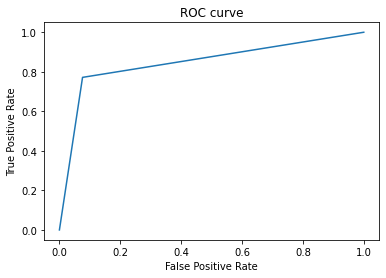

AUC value is 0.8478690664174535 


In [213]:
fpr, tpr, threshold= roc_curve(pred,y_test)
plt.plot(fpr, tpr)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC curve")
plt.show()
print("AUC value is {} ".format(auc(fpr, tpr)))

### 2. XGBoost Classifier:

In [214]:
## let's first fit the model
x_train,x_test,y_train,y_test=tts(new_x,y,test_size=0.25,random_state=23)
x_train_new,y_train_new=sm.fit_resample(x_train,y_train)
XGBClassifier().fit(x_train_new,y_train_new)

[00:47:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=4,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [215]:
grid_param={'n_estimators':[50,100,200],
           'learning_rate':[0.001,0.01,0.1,1],
           'max_depth':list(range(2,7))}

In [216]:
grid=GridSearchCV(XGBClassifier(),grid_param,cv=10,n_jobs=-1)
grid.fit(x_train_new,y_train_new)

[01:04:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=10,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     enable_categorical=False, gamma=None,
                                     gpu_id=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, scale_pos_weigh

In [217]:
grid.best_params_

{'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 200}

In [218]:
### reassigning the attributes of the model:-
xgb=XGBClassifier(n_estimators=200,learning_rate=0.1,max_depth=6)

xgb.fit(x_train_new,y_train_new)
y_pred=xgb.predict(x_test)
print("\n\n")
print("***********************Testing Scores******************************\n")
print("Accuracy score for testing is : ", accuracy_score(y_test,y_pred))
print("\n F1 Score for testing is : ", f1_score(y_test,y_pred))

matrix=confusion_matrix(y_test,y_pred)
print("Confusion Matrix : \n",matrix)
true_positive=matrix[0][0]
false_positive=matrix[0][1]
false_negative=matrix[1][0]
true_negative=matrix[1][1]
print("True positives are :- " ,true_positive)
print("False positives are :- " ,false_positive)
print("False negatives are :- " ,false_negative)
print("True negatives are :- " ,true_negative)
print("\n The Classification report for Testing \n", classification_report(y_test,y_pred))

[01:07:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.



***********************Testing Scores******************************

Accuracy score for testing is :  0.8795676788471436

 F1 Score for testing is :  0.7207637231503579
Confusion Matrix : 
 [[1407   76]
 [ 158  302]]
True positives are :-  1407
False positives are :-  76
False negatives are :-  158
True negatives are :-  302

 The Classification report for Testing 
               precision    recall  f1-score   support

         0.0       0.90      0.95      0.92      1483
         1.0       0.80      0.66      0.72       460

    accuracy                           0.88      1943
   macro avg       0.85      0.80      0.82      1943
weighted avg       0.88      0.88      0.88   

## ROC and AUC curve:

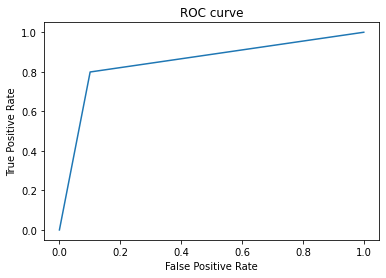

AUC value is 0.8489916662440624 


In [219]:
fpr, tpr, threshold= roc_curve(y_pred,y_test)
plt.plot(fpr, tpr)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC curve")
plt.show()
print("AUC value is {} ".format(auc(fpr, tpr)))

## `RandomForest` gives us the Best Accuracy with 90% so will consider it our Best Fit Model.

## Saving the Model:

In [220]:
import joblib
joblib.dump(Rf,'Weather_AUS_RainTomorrow_Prediction')

['Weather_AUS_RainTomorrow_Prediction']

## Comparing Actual VS Predicted.

In [221]:
original=np.array(y_test)
predicted=np.array(Rf.predict(x_test))
compare=pd.DataFrame({'Actual':original,'Predicted':predicted},index=range(len(original)))
compare

,Actual,Predicted
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,1.0,1.0
4,0.0,0.0
...,...,...
1938,0.0,0.0
1939,0.0,0.0
1940,1.0,1.0
1941,0.0,0.0


## 2. Prediction: `RainFall`

As rainfall is measure in mm then we have to build regression model for that.

In [227]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings 
warnings.filterwarnings('ignore')

In [228]:
### import dataset:
df=pd.read_csv('weatherAUS.csv')
pd.set_option('max_columns',None)
df.sample(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
3786,2016-02-09,Williamtown,18.3,27.3,0.2,4.2,10.0,SSE,35.0,SSE,SSW,24.0,17.0,67.0,63.0,1020.0,1018.9,5.0,3.0,24.0,26.2,No,No
6916,2014-12-13,Adelaide,16.7,35.9,NaN,NaN,NaN,WSW,43.0,NNE,WNW,15.0,22.0,20.0,13.0,1012.3,1009.1,NaN,NaN,29.1,34.6,NaN,No
8058,2014-03-27,PerthAirport,16.6,29.6,0.0,4.2,10.3,S,39.0,SE,SW,9.0,24.0,57.0,48.0,1017.9,1015.4,1.0,1.0,23.7,27.8,No,No
4508,2009-07-08,Wollongong,9.6,15.4,7.8,NaN,NaN,NNW,33.0,S,WSW,19.0,9.0,77.0,89.0,1030.0,1028.7,NaN,8.0,13.0,11.9,Yes,Yes
993,2009-06-04,CoffsHarbour,13.3,20.2,1.6,1.8,3.6,NE,20.0,NaN,ENE,0.0,9.0,97.0,78.0,1020.8,1015.9,7.0,5.0,15.8,18.8,Yes,No
226,2009-07-15,Albury,2.9,12.6,1.8,NaN,NaN,WSW,22.0,ENE,NaN,4.0,0.0,99.0,57.0,1010.5,1009.9,8.0,NaN,5.9,12.5,Yes,No
6021,2011-09-25,Melbourne,8.9,19.7,0.0,3.2,11.0,SSE,37.0,SE,SSE,13.0,19.0,61.0,34.0,1024.7,1021.8,NaN,NaN,12.3,19.2,No,No
6246,2011-05-27,Brisbane,9.6,23.7,0.0,3.2,9.8,SW,19.0,SW,WSW,6.0,4.0,64.0,39.0,1018.8,1015.8,1.0,1.0,16.3,22.6,No,No
606,2010-07-30,Albury,8.9,14.9,0.0,NaN,NaN,NNE,30.0,ENE,N,2.0,13.0,91.0,86.0,1015.5,1013.5,8.0,8.0,11.1,14.1,No,Yes
2833,2015-10-31,Williamtown,12.1,25.8,0.0,NaN,NaN,NE,43.0,NNE,NE,13.0,20.0,62.0,69.0,1021.4,1018.8,NaN,8.0,20.9,21.7,No,No


In [229]:
df.isna().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

- Rainfall has 240 missing values present in it so we will handle it later.

In [230]:
df.corr()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
MinTemp,1.000000,0.720955,0.091642,0.348643,0.081365,0.241317,0.137263,0.180091,-0.130906,0.079569,-0.465478,-0.458665,0.111213,0.046889,0.888342,0.689652
MaxTemp,0.720955,1.000000,-0.088906,0.424728,0.523909,0.146113,0.013425,0.088797,-0.392496,-0.424217,-0.347285,-0.430074,-0.307700,-0.301675,0.869503,0.978665
Rainfall,0.091642,-0.088906,1.000000,0.043463,-0.209654,0.104999,0.051349,0.025185,0.231702,0.238730,-0.080412,-0.037270,0.195157,0.159250,-0.007191,-0.092263
Evaporation,0.348643,0.424728,0.043463,1.000000,0.340893,0.214069,0.176701,0.142421,-0.286869,-0.221244,-0.218171,-0.233401,-0.084288,-0.152637,0.405467,0.414156
Sunshine,0.081365,0.523909,-0.209654,0.340893,1.000000,-0.018455,-0.025112,0.045031,-0.512349,-0.630536,0.028666,-0.047098,-0.705577,-0.723957,0.348708,0.546057
WindGustSpeed,0.241317,0.146113,0.104999,0.214069,-0.018455,1.000000,0.656079,0.711403,-0.286045,-0.097380,-0.430736,-0.394745,0.030124,0.104157,0.211477,0.106872
WindSpeed9am,0.137263,0.013425,0.051349,0.176701,-0.025112,0.656079,1.000000,0.566322,-0.358981,-0.111595,-0.197189,-0.156517,-0.000607,0.068930,0.109936,-0.002619
WindSpeed3pm,0.180091,0.088797,0.025185,0.142421,0.045031,0.711403,0.566322,1.000000,-0.252488,-0.091248,-0.291271,-0.240378,0.005807,0.003894,0.185329,0.066201
Humidity9am,-0.130906,-0.392496,0.231702,-0.286869,-0.512349,-0.286045,-0.358981,-0.252488,1.000000,0.636255,0.154699,0.188463,0.472126,0.352736,-0.378389,-0.383788
Humidity3pm,0.079569,-0.424217,0.238730,-0.221244,-0.630536,-0.097380,-0.111595,-0.091248,0.636255,1.000000,0.001763,0.076002,0.509797,0.520221,-0.130973,-0.491634


- humidity3pm is highly correlate with our target variable rainfall.

### handling Missing Values:

In [231]:
print(" Missing Values for Target varibale 'Rainfall' : ", df.Rainfall.isna().sum())
print("\n")
### Dropping na for target variable
df.dropna(subset=['Rainfall'],inplace=True)

print("After dropping the missing value in Rainfall variable, the number of missing value in Rainfall is: ",df.Rainfall.isna().sum())

 Missing Values for Target varibale 'Rainfall' :  240


After dropping the missing value in Rainfall variable, the number of missing value in Rainfall is:  0


In [232]:
print("New Shape of our dataset is : ",df.shape)

New Shape of our dataset is :  (8185, 23)


In [233]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [234]:
### Handling missing value for categorical features:
cat_features=df.select_dtypes(include=['object'])
for i in cat_features:
    if df[i].isna().any()==True:
        df[i].fillna(df[i].mode()[0], inplace=True)

In [235]:
df.isna().sum()

Date                0
Location            0
MinTemp            50
MaxTemp            45
Rainfall            0
Evaporation      3397
Sunshine         3880
WindGustDir         0
WindGustSpeed     967
WindDir9am          0
WindDir3pm          0
WindSpeed9am       50
WindSpeed3pm       89
Humidity9am        38
Humidity3pm        86
Pressure9am      1292
Pressure3pm      1295
Cloud9am         2231
Cloud3pm         2279
Temp9am            35
Temp3pm            80
RainToday           0
RainTomorrow        0
dtype: int64

In [236]:
num_features=df.select_dtypes(include=['float64'])
for i in num_features:
    if df[i].isna().any()==True:
        df[i].fillna(df[i].median(), inplace=True)

In [237]:
df.isna().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

- We have successfully fill the missing value of our dataset:

### Checking Outliers:

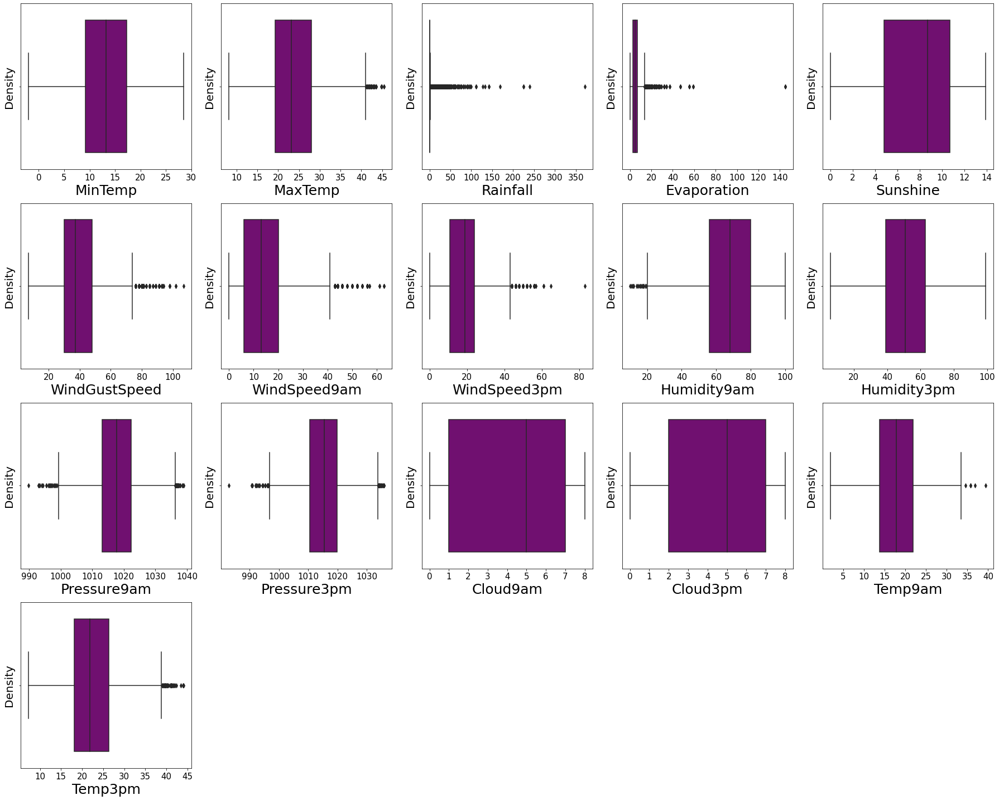

In [238]:
plt.figure(figsize=(25,20))
plotnumber=1
for column in num_features.columns:
    if plotnumber<=30:
        ax=plt.subplot(4,5,plotnumber)
        sns.boxplot(x=num_features[column],color='purple')
        plt.xlabel(column,fontsize=25)
        plt.ylabel('Density',fontsize=20)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
    plotnumber+=1
plt.tight_layout()

### Handling outlier using zscore:

In [240]:
## separating the continuous data type features
list_cont=['Rainfall','Evaporation','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Pressure9am',
           'Pressure3pm','Temp9am','Temp3pm']

from scipy.stats import zscore
z_score=zscore(df[list_cont])
abs_z_score=np.abs(z_score)

In [241]:
removing_outlier=(abs_z_score<3).all(axis=1)
df_new=df[removing_outlier]
print('Pervious Shape:', df.shape)
print('After removing the new shape : ',df_new.shape)

Pervious Shape: (8185, 23)
After removing the new shape :  (7765, 23)


In [242]:
### checking dataloss
loss=(8185-7765)/8185*100
print('The Data Loss is : ', loss)

The Data Loss is :  5.131337813072694


Data loss is in acceptable range let's move ahead.

### Convert date column into day,month and year colum:

In [243]:
### parse the datetime
df_new['Date']=pd.to_datetime(df_new['Date'])
df_new['Day']= df_new['Date'].dt.day
df_new['Month']= df_new['Date'].dt.month
df_new['Year']= df_new['Date'].dt.year
### dropping the date column
df_new.drop('Date',axis=1,inplace=True)
df_new.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,4.6,8.7,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,4.6,8.7,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,4.6,8.7,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,4.6,8.7,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,4.6,8.7,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008


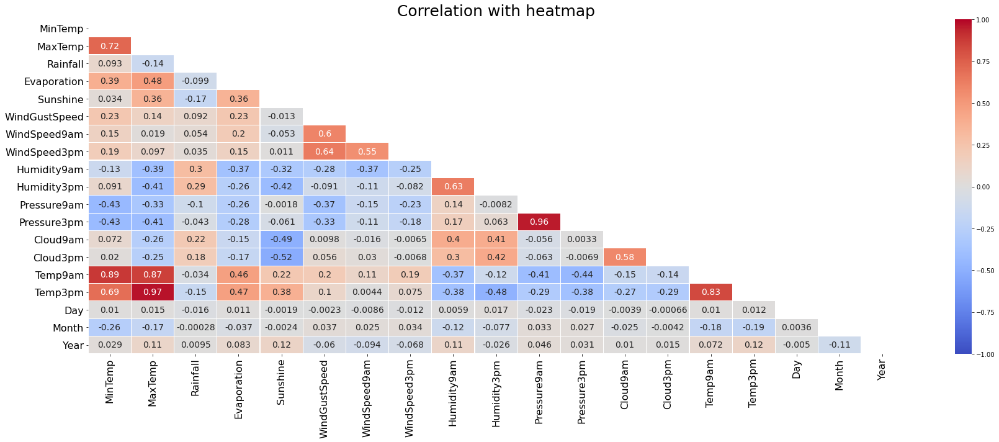

In [244]:
plt.figure(figsize=(25, 10))

corr = df_new.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

ax = sns.heatmap(corr, mask=mask, xticklabels=corr.columns, yticklabels=corr.columns, annot_kws={'size':14},
                 annot=True, linewidths=.2, cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.title("Correlation with heatmap",fontsize=25)
plt.tight_layout()

### Observation:-
- Humidity is very high correlate with target variable.
- WindSpeed9am is least correalte with target variable.
- MaxTemp and Temp3pm features are highest correlated with each other as 97% correlation.
- similarly Pressure9am and pressure3pm features also highly correlated with each other as 96% correlation.
- MaxTtemp and minTemp are highly correlate with Temp9am as 86% and 89% respectvely.
- Temp9am is 83% correlated with temp3pm.

 ### Correlation With Target:

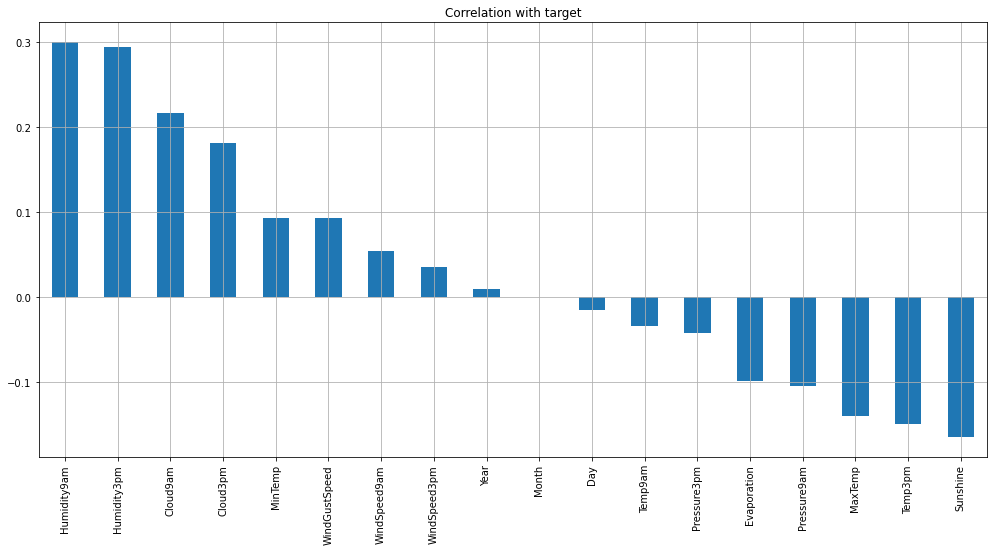

In [245]:
plt.figure(figsize=(15,10))
df_new.drop('Rainfall',axis=1).corrwith(df_new.Rainfall).sort_values(ascending=False).plot(kind='bar',grid=True,figsize=(17,8),title='Correlation with target')

plt.show()

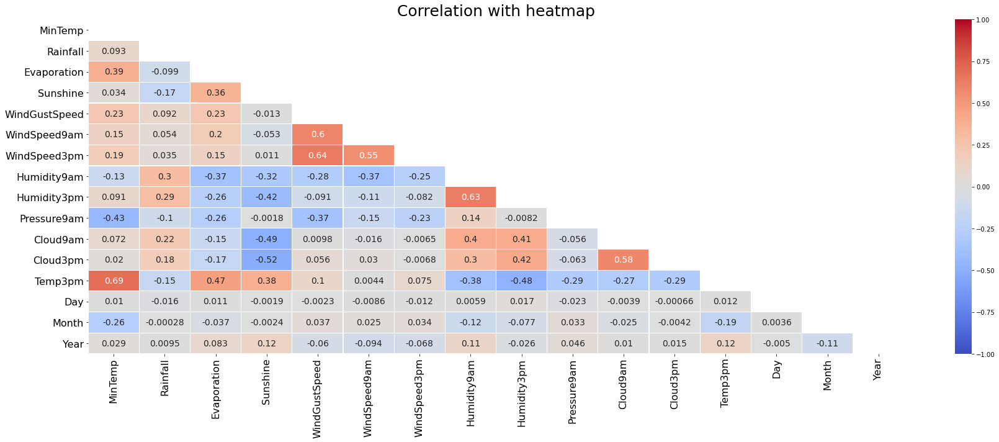

In [246]:
df_new.drop(columns=['Temp9am','Pressure3pm','MaxTemp'],inplace=True)
plt.figure(figsize=(25, 10))


corr = df_new.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

ax = sns.heatmap(corr, mask=mask, xticklabels=corr.columns, yticklabels=corr.columns, annot_kws={'size':14},
                 annot=True, linewidths=.2, cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.title("Correlation with heatmap",fontsize=25)
plt.tight_layout()

## Encoding:

In [247]:
df_new.Year=df_new['Year'].astype(str)
df_new.dtypes


Location          object
MinTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Cloud9am         float64
Cloud3pm         float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
Day                int64
Month              int64
Year              object
dtype: object

## Checking Skewness:

In [248]:
df_new.skew()

MinTemp         -0.074128
Rainfall         3.466638
Evaporation      1.292507
Sunshine        -1.215186
WindGustSpeed    0.603472
WindSpeed9am     0.722135
WindSpeed3pm     0.307418
Humidity9am     -0.257988
Humidity3pm      0.121830
Pressure9am      0.024546
Cloud9am        -0.485200
Cloud3pm        -0.434334
Temp3pm          0.331307
Day             -0.000064
Month            0.063099
Year             0.435680
dtype: float64

In [249]:
### handling Skewness:
feature=['Evaporation','Sunshine','WindSpeed9am','WindGustSpeed']
from sklearn.preprocessing import PowerTransformer
pt=PowerTransformer()
for i in feature:
    df_new[i]=pt.fit_transform(df_new[i].values.reshape(-1,1))
df_new.skew()

MinTemp         -0.074128
Rainfall         3.466638
Evaporation      0.059843
Sunshine        -0.206194
WindGustSpeed    0.005788
WindSpeed9am    -0.112530
WindSpeed3pm     0.307418
Humidity9am     -0.257988
Humidity3pm      0.121830
Pressure9am      0.024546
Cloud9am        -0.485200
Cloud3pm        -0.434334
Temp3pm          0.331307
Day             -0.000064
Month            0.063099
Year             0.435680
dtype: float64

In [250]:
df1=pd.get_dummies(df_new[['Location','WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow']],drop_first=True)
df1

,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes
0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8421,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8422,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
8423,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [251]:
df_new.drop(columns=['Location','WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow'],inplace=True)
df=df_new.join(df1)
df

,MinTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,Temp3pm,Day,Month,Year,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes
0,13.4,0.6,0.02636,0.059374,0.484086,0.790493,24.0,71.0,22.0,1007.7,8.0,5.0,21.8,1,12,2008,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,7.4,0.0,0.02636,0.059374,0.484086,-0.966498,22.0,44.0,25.0,1010.6,5.0,5.0,24.3,2,12,2008,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,12.9,0.0,0.02636,0.059374,0.626982,0.707377,26.0,38.0,30.0,1007.6,5.0,2.0,23.2,3,12,2008,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,9.2,0.0,0.02636,0.059374,-1.222540,-0.049554,9.0,45.0,16.0,1017.6,5.0,5.0,26.5,4,12,2008,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,17.5,1.0,0.02636,0.059374,0.262400,-0.525033,20.0,82.0,33.0,1010.8,7.0,8.0,29.7,5,12,2008,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,0.0,0.02636,0.059374,-0.554230,0.158533,11.0,51.0,24.0,1024.6,5.0,5.0,22.4,21,6,2017,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8421,3.6,0.0,0.02636,0.059374,-1.433790,0.158533,9.0,56.0,21.0,1023.5,5.0,5.0,24.5,22,6,2017,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8422,5.4,0.0,0.02636,0.059374,-0.048518,-0.275517,9.0,53.0,24.0,1021.0,5.0,5.0,26.1,23,6,2017,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
8423,7.8,0.0,0.02636,0.059374,-0.828655,0.158533,7.0,51.0,24.0,1019.4,3.0,2.0,26.0,24,6,2017,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [252]:
df.Rainfall.value_counts()

0.0     5082
0.2      390
0.4      176
0.6      115
1.2       82
        ... 
27.0       1
24.8       1
18.0       1
32.8       1
21.6       1
Name: Rainfall, Length: 171, dtype: int64

In [253]:
### Splitting the dataset
x=df.drop('Rainfall',axis=1)
y=df['Rainfall']
print(x.isna().any().sum())
print(y.isna().sum())

0
0


### Scaling The dataset:


In [254]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
## scaling
for i in x.columns:
    x[i]=scaler.fit_transform(x[i].values.reshape(-1,1))
x.head(10)

,MinTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,Temp3pm,Day,Month,Year,Location_Albury,Location_Brisbane,Location_CoffsHarbour,Location_Darwin,Location_Melbourne,Location_Newcastle,Location_Penrith,Location_PerthAirport,Location_Uluru,Location_Williamtown,Location_Wollongong,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_Yes,RainTomorrow_Yes
0,0.508251,0.476674,0.456456,0.647898,0.624569,0.521739,0.677778,0.172043,0.227027,1.000,0.625,0.442073,0.000000,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.310231,0.476674,0.456456,0.647898,0.213717,0.478261,0.377778,0.204301,0.305405,0.625,0.625,0.518293,0.033333,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.491749,0.476674,0.456456,0.670676,0.605134,0.565217,0.311111,0.258065,0.224324,0.625,0.250,0.484756,0.066667,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.369637,0.476674,0.456456,0.375862,0.428134,0.195652,0.388889,0.107527,0.494595,0.625,0.625,0.585366,0.100000,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.643564,0.476674,0.456456,0.612561,0.316949,0.434783,0.800000,0.290323,0.310811,0.875,1.000,0.682927,0.133333,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.547855,0.476674,0.456456,0.776629,0.605134,0.521739,0.500000,0.182796,0.267568,0.625,0.625,0.658537,0.166667,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
6,0.537954,0.476674,0.456456,0.714543,0.624569,0.521739,0.433333,0.139785,0.278378,0.125,0.625,0.527439,0.200000,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
7,0.320132,0.476674,0.456456,0.537041,0.285071,0.369565,0.422222,0.139785,0.381081,0.625,0.625,0.554878,0.233333,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
8,0.386139,0.476674,0.456456,0.991923,0.316949,0.608696,0.355556,0.032258,0.259459,0.625,0.625,0.698171,0.266667,1.0,0.0,1.0,0.0,0.0,

In [255]:
from sklearn.feature_selection import SelectKBest,f_classif

In [256]:
best_features=SelectKBest(score_func=f_classif,k=30)  ### choosing top 50 features.
fit=best_features.fit(x,y)

In [257]:
df_scores=pd.DataFrame(fit.scores_)
df_columns=pd.DataFrame(x.columns)

### joining the both data frame
features_scores=pd.concat([df_columns,df_scores],axis=1)
features_scores.columns=['Feature_name','Score']
print(features_scores.nlargest(30,'Score'))

            Feature_name      Score
71         RainToday_Yes        inf
6            Humidity9am  11.420468
7            Humidity3pm  10.336343
72      RainTomorrow_Yes   8.300178
9               Cloud9am   5.637431
2               Sunshine   5.059016
11               Temp3pm   4.892871
10              Cloud3pm   4.815786
20    Location_Newcastle   3.975086
1            Evaporation   3.606060
55        WindDir9am_WSW   3.156514
66        WindDir3pm_SSW   2.621164
8            Pressure9am   2.352062
28         WindGustDir_N   2.349573
52         WindDir9am_SW   2.285878
63          WindDir3pm_S   2.258980
33         WindGustDir_S   2.228070
40       WindGustDir_WSW   2.188796
53          WindDir9am_W   2.072131
25   Location_Wollongong   2.065810
42        WindDir9am_ESE   2.040717
24  Location_Williamtown   2.027039
5           WindSpeed3pm   2.018848
48          WindDir9am_S   2.004751
51        WindDir9am_SSW   1.990191
14                  Year   1.981650
35       WindGustDir_SSE   1

In [259]:
X=x[['RainToday_Yes','Humidity9am','Humidity3pm','RainTomorrow_Yes','Cloud9am','Sunshine','Cloud3pm','Temp3pm',
     'WindDir9am_WSW','Location_Newcastle','WindDir3pm_SSW','Evaporation','WindDir9am_S','WindGustDir_WSW',
      'WindDir9am_ESE','WindGustDir_S','WindDir9am_SW','WindDir3pm_S','Location_CoffsHarbour','Pressure9am','WindDir9am_SSW',
      'WindGustDir_N','Location_Wollongong','WindSpeed3pm','Location_Williamtown','Year','WindGustDir_SW','WindGustDir_SE',
      'WindDir3pm_SE']]
X

,RainToday_Yes,Humidity9am,Humidity3pm,RainTomorrow_Yes,Cloud9am,Sunshine,Cloud3pm,Temp3pm,WindDir9am_WSW,Location_Newcastle,WindDir3pm_SSW,Evaporation,WindDir9am_S,WindGustDir_WSW,WindDir9am_ESE,WindGustDir_S,WindDir9am_SW,WindDir3pm_S,Location_CoffsHarbour,Pressure9am,WindDir9am_SSW,WindGustDir_N,Location_Wollongong,WindSpeed3pm,Location_Williamtown,Year,WindGustDir_SW,WindGustDir_SE,WindDir3pm_SE
0,0.0,0.677778,0.172043,0.0,1.000,0.456456,0.625,0.442073,0.0,0.0,0.0,0.476674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.227027,0.0,0.0,0.0,0.521739,0.0,0.0,0.0,0.0,0.0
1,0.0,0.377778,0.204301,0.0,0.625,0.456456,0.625,0.518293,0.0,0.0,0.0,0.476674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.305405,0.0,0.0,0.0,0.478261,0.0,0.0,0.0,0.0,0.0
2,0.0,0.311111,0.258065,0.0,0.625,0.456456,0.250,0.484756,0.0,0.0,0.0,0.476674,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.224324,0.0,0.0,0.0,0.565217,0.0,0.0,0.0,0.0,0.0
3,0.0,0.388889,0.107527,0.0,0.625,0.456456,0.625,0.585366,0.0,0.0,0.0,0.476674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.494595,0.0,0.0,0.0,0.195652,0.0,0.0,0.0,0.0,0.0
4,0.0,0.800000,0.290323,0.0,0.875,0.456456,1.000,0.682927,0.0,0.0,0.0,0.476674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.310811,0.0,0.0,0.0,0.434783,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,0.0,0.455556,0.193548,0.0,0.625,0.456456,0.625,0.460366,0.0,0.0,0.0,0.476674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.683784,0.0,0.0,0.0,0.239130,0.0,1.0,0.0,0.0,0.0
8421,0.0,0.511111,0.161290,0.0,0.625,0.456456,0.625,0.524390,0.0,0.0,0.0,0.476674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.654054,0.0,0.0,0.0,0.195652,0.0,1.0,0.0,0.0,0.0
8422,0.0,0.477778,0.193548,0.0,0.625,0.456456,0.625,0.573171,0.0,0.0,0.0,0.476674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.586486,0.0,1.0,0.0,0.195652,0.0,1.0,0.0,0.0,0.0
8423,0.0,0.455556,0.193548,0.0,0.375,0.456456,0.250,0.570122,0.0,0.0,0.0,0.476674,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.543243,0.0,0.0,0.0,0.152174,0.0,1.0,0.0,1.0,0.0


In [260]:
y

0       0.6
1       0.0
2       0.0
3       0.0
4       1.0
       ... 
8420    0.0
8421    0.0
8422    0.0
8423    0.0
8424    0.0
Name: Rainfall, Length: 7765, dtype: float64

## Model Building:

In [261]:
## importing libraries
from sklearn.model_selection import train_test_split as tts
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from xgboost  import XGBRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
## importing evaluation  metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import mean_squared_error as MSE

## Defining a function for finding a best random state.

In [262]:
## Defining a function for Finding the  best Random State.
def random_state(model,feature,target):
    mini=0
    for  i in range(0,51):
        x_train,x_test,y_train,y_test=tts(feature,target,test_size=.25,random_state=i)
        model.fit(x_train,y_train)
        pred_train=model.predict(x_train)
        pred_test=model.predict(x_test)
        score=r2_score(y_test,pred_test)
        if score>mini:
            mini=score
            j=i
    return j
        

## Defining A function for Evaluation:

In [263]:
def print_score(clf,X,Y):
    x_train,x_test,y_train,y_test=tts(X,Y,test_size=0.25,random_state=random_state(clf,X,Y))
    clf.fit(x_train,y_train)
    train_pred=clf.predict(x_train)
    test_pred=clf.predict(x_test)
    train_r2=r2_score(y_train,train_pred)*100
    test_r2=r2_score(y_test,test_pred)*100
    mse=MSE(test_pred,y_test)
    mae=MAE(test_pred,y_test,)
    Rmse=np.sqrt(MSE(y_test,test_pred))
    print("\n****************************Training R2 Score***************************")
    print("\n Training Accuracy Score is : ",train_r2)
    print('\n \n')
    print("******************************Testing R2 Score****************************")
    print("\nTesting Accuracy Score is : ",test_r2)
    print("Mean Squared Error is : ", mse)
    print("Mean Absolute Error is : ", mae)
    print("Squared of Mean Squared Error is : ",Rmse)
    

## Defining a function for cross Validation:

In [264]:
from sklearn.model_selection import cross_val_score
def cross_validation(Model,independent,dependent):
    x_train,x_test,y_train,y_test=tts(independent,dependent,test_size=.25,random_state=random_state(Model,independent,dependent))
    Model.fit(x_train,y_train)
    Model.predict(x_train)
    y_pred=Model.predict(x_test)
    score=r2_score(y_test,y_pred)
    for i in range(2,11):
        cv_score=cross_val_score(Model,X,y,cv=i)
        print('At cv :- ', i)
        print('Cross Validation score is :- ', cv_score.mean())
        print('Testing Accuracy score is :- ',score)
        print('\n')

In [265]:
### Random State
random_state(LinearRegression(),X,y)

23

In [266]:
print_score(LinearRegression(),X,y)


****************************Training R2 Score***************************

 Training Accuracy Score is :  49.172826140046375

 

******************************Testing R2 Score****************************

Testing Accuracy Score is :  51.387056651376405
Mean Squared Error is :  11.642980104775873
Mean Absolute Error is :  1.6213669119716332
Squared of Mean Squared Error is :  3.4121811359855845


## Cross Validation for LinearRegression

In [267]:
cross_validation(LinearRegression(),X,y)

At cv :-  2
Cross Validation score is :-  0.48665447218132885
Testing Accuracy score is :-  0.5138705665137641


At cv :-  3
Cross Validation score is :-  0.4845448921178368
Testing Accuracy score is :-  0.5138705665137641


At cv :-  4
Cross Validation score is :-  0.4841033721966825
Testing Accuracy score is :-  0.5138705665137641


At cv :-  5
Cross Validation score is :-  0.48875928491626797
Testing Accuracy score is :-  0.5138705665137641


At cv :-  6
Cross Validation score is :-  0.4882514088523405
Testing Accuracy score is :-  0.5138705665137641


At cv :-  7
Cross Validation score is :-  0.47750623131663267
Testing Accuracy score is :-  0.5138705665137641


At cv :-  8
Cross Validation score is :-  0.4891532101097244
Testing Accuracy score is :-  0.5138705665137641


At cv :-  9
Cross Validation score is :-  0.48805917380054553
Testing Accuracy score is :-  0.5138705665137641


At cv :-  10
Cross Validation score is :-  0.4878119137869968
Testing Accuracy score is :-  0.513870

### Decision Tree:

In [268]:
## Random State
random_state(DecisionTreeRegressor(),X,y)

37

In [269]:
print_score(DecisionTreeRegressor(),X,y)


****************************Training R2 Score***************************

 Training Accuracy Score is :  99.87429573063066

 

******************************Testing R2 Score****************************

Testing Accuracy Score is :  46.476277136553094
Mean Squared Error is :  12.617255406797115
Mean Absolute Error is :  1.0310504634397526
Squared of Mean Squared Error is :  3.5520776183519858


## Cross Validation for Decision Tree

In [270]:
cross_validation(DecisionTreeRegressor(),X,y)

At cv :-  2
Cross Validation score is :-  0.027746151998987112
Testing Accuracy score is :-  0.48663713580857704


At cv :-  3
Cross Validation score is :-  0.1089830583272029
Testing Accuracy score is :-  0.48663713580857704


At cv :-  4
Cross Validation score is :-  0.06150205445529902
Testing Accuracy score is :-  0.48663713580857704


At cv :-  5
Cross Validation score is :-  0.18653059749093243
Testing Accuracy score is :-  0.48663713580857704


At cv :-  6
Cross Validation score is :-  0.12258030920497387
Testing Accuracy score is :-  0.48663713580857704


At cv :-  7
Cross Validation score is :-  0.18164536364231973
Testing Accuracy score is :-  0.48663713580857704


At cv :-  8
Cross Validation score is :-  0.2685593638086589
Testing Accuracy score is :-  0.48663713580857704


At cv :-  9
Cross Validation score is :-  0.25852329314777495
Testing Accuracy score is :-  0.48663713580857704


At cv :-  10
Cross Validation score is :-  0.36424954346433147
Testing Accuracy score is 

## KNN Model:

In [271]:
## random state
random_state(KNeighborsRegressor(),X,y)

48

In [272]:
print_score(KNeighborsRegressor(),X,y)


****************************Training R2 Score***************************

 Training Accuracy Score is :  62.09975650184872

 

******************************Testing R2 Score****************************

Testing Accuracy Score is :  50.05872024316429
Mean Squared Error is :  12.717520494335737
Mean Absolute Error is :  1.392811534500515
Squared of Mean Squared Error is :  3.5661632736507927


### cross Validation for KNN:

In [273]:
cross_validation(KNeighborsRegressor(),X,y)

At cv :-  2
Cross Validation score is :-  0.43001592716523235
Testing Accuracy score is :-  0.5005872024316429


At cv :-  3
Cross Validation score is :-  0.40022802709814903
Testing Accuracy score is :-  0.5005872024316429


At cv :-  4
Cross Validation score is :-  0.4128453982870701
Testing Accuracy score is :-  0.5005872024316429


At cv :-  5
Cross Validation score is :-  0.4384423249952919
Testing Accuracy score is :-  0.5005872024316429


At cv :-  6
Cross Validation score is :-  0.4328602934886649
Testing Accuracy score is :-  0.5005872024316429


At cv :-  7
Cross Validation score is :-  0.43110508250231117
Testing Accuracy score is :-  0.5005872024316429


At cv :-  8
Cross Validation score is :-  0.46791885778602327
Testing Accuracy score is :-  0.5005872024316429


At cv :-  9
Cross Validation score is :-  0.47034535501190194
Testing Accuracy score is :-  0.5005872024316429


At cv :-  10
Cross Validation score is :-  0.4718917843963439
Testing Accuracy score is :-  0.50058

## Random Forest:

In [275]:
## Random State
random_state(RandomForestRegressor(),X,y)

28

In [276]:
print_score(RandomForestRegressor(),X,y)


****************************Training R2 Score***************************

 Training Accuracy Score is :  94.21190194097994

 

******************************Testing R2 Score****************************

Testing Accuracy Score is :  66.55808492055492
Mean Squared Error is :  7.807670359180451
Mean Absolute Error is :  1.0479086165465157
Squared of Mean Squared Error is :  2.794220885896541


## Cross Validation for Random Forest:

In [277]:
cross_validation(RandomForestRegressor(),X,y)

At cv :-  2
Cross Validation score is :-  0.5199152779528542
Testing Accuracy score is :-  0.6661247197804671


At cv :-  3
Cross Validation score is :-  0.515691988831869
Testing Accuracy score is :-  0.6661247197804671


At cv :-  4
Cross Validation score is :-  0.5123769487739651
Testing Accuracy score is :-  0.6661247197804671


At cv :-  5
Cross Validation score is :-  0.5508210122673535
Testing Accuracy score is :-  0.6661247197804671


At cv :-  6
Cross Validation score is :-  0.562489118699496
Testing Accuracy score is :-  0.6661247197804671


At cv :-  7
Cross Validation score is :-  0.5629554523916894
Testing Accuracy score is :-  0.6661247197804671


At cv :-  8
Cross Validation score is :-  0.6140909261837291
Testing Accuracy score is :-  0.6661247197804671


At cv :-  9
Cross Validation score is :-  0.6317307870403792
Testing Accuracy score is :-  0.6661247197804671


At cv :-  10
Cross Validation score is :-  0.634574642533746
Testing Accuracy score is :-  0.6661247197804

## SVR:

In [278]:
## Random State
random_state(SVR(),X,y)

45

In [279]:
print_score(SVR(),X,y)


****************************Training R2 Score***************************

 Training Accuracy Score is :  44.2370210467483

 

******************************Testing R2 Score****************************

Testing Accuracy Score is :  44.28231796738822
Mean Squared Error is :  11.272367843803606
Mean Absolute Error is :  1.1566774404470435
Squared of Mean Squared Error is :  3.3574347117708196


### Cross Validation for SVR:

In [280]:
cross_validation(SVR(),X,y)

At cv :-  2
Cross Validation score is :-  0.35792431997990026
Testing Accuracy score is :-  0.4428231796738822


At cv :-  3
Cross Validation score is :-  0.3597877041954774
Testing Accuracy score is :-  0.4428231796738822


At cv :-  4
Cross Validation score is :-  0.3915245251304597
Testing Accuracy score is :-  0.4428231796738822


At cv :-  5
Cross Validation score is :-  0.39562509284252023
Testing Accuracy score is :-  0.4428231796738822


At cv :-  6
Cross Validation score is :-  0.392711804737258
Testing Accuracy score is :-  0.4428231796738822


At cv :-  7
Cross Validation score is :-  0.39672289320866483
Testing Accuracy score is :-  0.4428231796738822


At cv :-  8
Cross Validation score is :-  0.4124254360110332
Testing Accuracy score is :-  0.4428231796738822


At cv :-  9
Cross Validation score is :-  0.4113165812801676
Testing Accuracy score is :-  0.4428231796738822


At cv :-  10
Cross Validation score is :-  0.40780277204988274
Testing Accuracy score is :-  0.4428231

## ADA BOOst:

In [281]:
## random State
random_state(AdaBoostRegressor(),X,y)

20

In [282]:
## Random STate
random_state(GradientBoostingRegressor(),X,y)

11

### Cross Validation for ADA BOOST:

In [283]:
cross_validation(AdaBoostRegressor(),X,y)

At cv :-  2
Cross Validation score is :-  0.3283144744119253
Testing Accuracy score is :-  0.4338723689917221


At cv :-  3
Cross Validation score is :-  0.3963325149008797
Testing Accuracy score is :-  0.4338723689917221


At cv :-  4
Cross Validation score is :-  0.3907484950544424
Testing Accuracy score is :-  0.4338723689917221


At cv :-  5
Cross Validation score is :-  0.38353255598419866
Testing Accuracy score is :-  0.4338723689917221


At cv :-  6
Cross Validation score is :-  0.356617334179826
Testing Accuracy score is :-  0.4338723689917221


At cv :-  7
Cross Validation score is :-  0.3500006388698543
Testing Accuracy score is :-  0.4338723689917221


At cv :-  8
Cross Validation score is :-  0.36890150803059407
Testing Accuracy score is :-  0.4338723689917221


At cv :-  9
Cross Validation score is :-  0.3784945904802094
Testing Accuracy score is :-  0.4338723689917221


At cv :-  10
Cross Validation score is :-  0.3623324151116683
Testing Accuracy score is :-  0.433872368

### Gradient Boosting :

In [284]:

## Random STate
random_state(GradientBoostingRegressor(),X,y)

11

In [285]:
print_score(GradientBoostingRegressor(),X,y)


****************************Training R2 Score***************************

 Training Accuracy Score is :  63.67678578555914

 

******************************Testing R2 Score****************************

Testing Accuracy Score is :  57.54005512004734
Mean Squared Error is :  10.663540542365704
Mean Absolute Error is :  1.309186862915138
Squared of Mean Squared Error is :  3.265507700552198


## cross Validation for GBDT:

In [286]:
cross_validation(GradientBoostingRegressor(),X,y)

At cv :-  2
Cross Validation score is :-  0.49310189337433463
Testing Accuracy score is :-  0.5749406135277497


At cv :-  3
Cross Validation score is :-  0.4845397632081679
Testing Accuracy score is :-  0.5749406135277497


At cv :-  4
Cross Validation score is :-  0.49135660927522257
Testing Accuracy score is :-  0.5749406135277497


At cv :-  5
Cross Validation score is :-  0.507743500016565
Testing Accuracy score is :-  0.5749406135277497


At cv :-  6
Cross Validation score is :-  0.5066066674483816
Testing Accuracy score is :-  0.5749406135277497


At cv :-  7
Cross Validation score is :-  0.51432889966032
Testing Accuracy score is :-  0.5749406135277497


At cv :-  8
Cross Validation score is :-  0.5263885584756449
Testing Accuracy score is :-  0.5749406135277497


At cv :-  9
Cross Validation score is :-  0.53684968218028
Testing Accuracy score is :-  0.5749406135277497


At cv :-  10
Cross Validation score is :-  0.5401224458492401
Testing Accuracy score is :-  0.5749406135277

## XGB

In [287]:
## Random State
random_state(XGBRegressor(),X,y)

32

In [288]:
print_score(XGBRegressor(),X,y)


****************************Training R2 Score***************************

 Training Accuracy Score is :  97.05823694383511

 

******************************Testing R2 Score****************************

Testing Accuracy Score is :  66.09339929572747
Mean Squared Error is :  8.656758321708441
Mean Absolute Error is :  1.0959432751142222
Squared of Mean Squared Error is :  2.942236958796562


### Cross Validation for XGB:

In [289]:
cross_validation(XGBRegressor(),X,y)

At cv :-  2
Cross Validation score is :-  0.43325196400029187
Testing Accuracy score is :-  0.6609339929572746


At cv :-  3
Cross Validation score is :-  0.41521849518873966
Testing Accuracy score is :-  0.6609339929572746


At cv :-  4
Cross Validation score is :-  0.4492429614298493
Testing Accuracy score is :-  0.6609339929572746


At cv :-  5
Cross Validation score is :-  0.4954856233126833
Testing Accuracy score is :-  0.6609339929572746


At cv :-  6
Cross Validation score is :-  0.5183447004389757
Testing Accuracy score is :-  0.6609339929572746


At cv :-  7
Cross Validation score is :-  0.5023442036622504
Testing Accuracy score is :-  0.6609339929572746


At cv :-  8
Cross Validation score is :-  0.5778682692223884
Testing Accuracy score is :-  0.6609339929572746


At cv :-  9
Cross Validation score is :-  0.5920018914214147
Testing Accuracy score is :-  0.6609339929572746


At cv :-  10
Cross Validation score is :-  0.6205595380621188
Testing Accuracy score is :-  0.66093399

## `Random Forest Give us the best accuracy.`

### HyperParameter Tunning:


In [291]:
    x_train,x_test,y_train,y_test=tts(X,y,test_size=0.25,random_state=28)
    RandomForestRegressor().fit(x_train,y_train)

RandomForestRegressor()

In [292]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [293]:
param={'n_estimators':[50,100,200],
       'criterion' : ["squared_error", "absolute_error", "poisson"]}

In [296]:
gridsearch=RandomizedSearchCV(RandomForestRegressor(),param,cv=10,n_jobs=-1)

In [297]:
gridsearch.fit(x_train,y_train)

RandomizedSearchCV(cv=10, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'criterion': ['squared_error',
                                                      'absolute_error',
                                                      'poisson'],
                                        'n_estimators': [50, 100, 200]})

In [298]:
gridsearch.best_params_

{'n_estimators': 200, 'criterion': 'absolute_error'}

In [301]:
randomforest=RandomForestRegressor(n_estimators=200,criterion='absolute_error')
randomforest.fit(x_train,y_train)


RandomForestRegressor(criterion='absolute_error', n_estimators=200)

In [302]:
test_pred=randomforest.predict(x_test)
train_pred=randomforest.predict(x_train)


In [304]:
train_r2=r2_score(y_train,train_pred)*100
test_r2=r2_score(y_test,test_pred)*100
mse=MSE(test_pred,y_test)
mae=MAE(test_pred,y_test,)
Rmse=np.sqrt(MSE(y_test,test_pred))


## Model Evaluation:

In [305]:
print("\n****************************Training R2 Score***************************")
print("\n Training Accuracy Score is : ",train_r2)
print('\n \n')
print("******************************Testing R2 Score****************************")
print("\nTesting Accuracy Score is : ",test_r2)
print("Mean Squared Error is : ", mse)
print("Mean Absolute Error is : ", mae)
print("Squared of Mean Squared Error is : ",Rmse)
    


****************************Training R2 Score***************************

 Training Accuracy Score is :  94.32177122385953

 

******************************Testing R2 Score****************************

Testing Accuracy Score is :  66.27494646705318
Mean Squared Error is :  7.86660572631308
Mean Absolute Error is :  1.0417348094747685
Squared of Mean Squared Error is :  2.8047469986280547


### Saving the best Model:

In [306]:
import joblib
joblib.dump(randomforest,'Weather_AUS_RainFall_Prediction')

['Weather_AUS_RainFall_Prediction']

In [309]:
original=np.array(y_test)
predicted=np.array(randomforest.predict(x_test))
compare=pd.DataFrame({'Actual':original,'Predicted':predicted},index=range(len(original)))
compare

,Actual,Predicted
0,0.2,0.1460
1,0.0,0.0065
2,0.2,0.2160
3,0.0,0.0080
4,3.4,6.1860
...,...,...
1937,0.0,0.0760
1938,0.4,0.2720
1939,0.0,0.1050
1940,18.8,7.8860
